In [1]:
import numpy as np
import pandas as pd

# Visualisation Libraries
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import warnings
import re


In [3]:
df = pd.read_csv("F:/1.0 T H A P A R/SUBJECTS/sem2/2.0 ML/LMS (SUBJECT + LAB)/2.0 ML LAB/Project/FinalDataset.csv")


print('Loading dataset from csv file and printing the head...\n')
df.head()

Loading dataset from csv file and printing the head...



,State_Name,District_Name,Crop_Year,Season,Crop,Temperature,Humidity,Soil_Moisture,Area,Production
0,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Arecanut,36,35,45,1254.0,2000.0
1,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Other Kharif pulses,37,40,46,2.0,1.0
2,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Rice,36,41,50,102.0,321.0
3,Andaman and Nicobar Islands,NICOBARS,2000,Whole Year,Banana,37,42,55,176.0,641.0
4,Andaman and Nicobar Islands,NICOBARS,2000,Whole Year,Cashewnut,36,40,54,720.0,165.0


In [5]:
df.tail()

,State_Name,District_Name,Crop_Year,Season,Crop,Temperature,Humidity,Soil_Moisture,Area,Production
49779,Chhattisgarh,JANJGIR-CHAMPA,2006,Kharif,Small millets,36,35,45,27.0,7.0
49780,Chhattisgarh,JANJGIR-CHAMPA,2006,Kharif,Soyabean,37,40,46,27.0,32.0
49781,Chhattisgarh,JANJGIR-CHAMPA,2006,Kharif,Sunflower,36,41,50,450.0,213.0
49782,Chhattisgarh,JANJGIR-CHAMPA,2006,Kharif,Urad,37,42,55,1778.0,309.0
49783,Chhattisgarh,JANJGIR-CHAMPA,2006,Rabi,Gram,36,40,54,216.0,194.0


In [7]:
df

,State_Name,District_Name,Crop_Year,Season,Crop,Temperature,Humidity,Soil_Moisture,Area,Production
0,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Arecanut,36,35,45,1254.0,2000.0
1,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Other Kharif pulses,37,40,46,2.0,1.0
2,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Rice,36,41,50,102.0,321.0
3,Andaman and Nicobar Islands,NICOBARS,2000,Whole Year,Banana,37,42,55,176.0,641.0
4,Andaman and Nicobar Islands,NICOBARS,2000,Whole Year,Cashewnut,36,40,54,720.0,165.0
...,...,...,...,...,...,...,...,...,...,...
49779,Chhattisgarh,JANJGIR-CHAMPA,2006,Kharif,Small millets,36,35,45,27.0,7.0
49780,Chhattisgarh,JANJGIR-CHAMPA,2006,Kharif,Soyabean,37,40,46,27.0,32.0
49781,Chhattisgarh,JANJGIR-CHAMPA,2006,Kharif,Sunflower,36,41,50,450.0,213.0
49782,Chhattisgarh,JANJGIR-CHAMPA,2006,Kharif,Urad,37,42,55,1778.0,309.0


In [9]:
df.shape

(49784, 10)

In [11]:
df.dtypes

State_Name        object
District_Name     object
Crop_Year          int64
Season            object
Crop              object
Temperature        int64
Humidity           int64
Soil_Moisture      int64
Area             float64
Production       float64
dtype: object

In [13]:
df.describe()

,Crop_Year,Temperature,Humidity,Soil_Moisture,Area,Production
count,49784.000000,49784.000000,49784.000000,49784.000000,49784.000000,4.978400e+04
mean,2005.872087,34.445746,44.775269,53.109312,7393.028993,4.132019e+05
std,5.108602,3.498277,6.662586,5.259326,27983.253218,1.232609e+07
min,1997.000000,25.000000,35.000000,45.000000,0.200000,0.000000e+00
25%,2002.000000,34.000000,40.000000,50.000000,78.000000,8.700000e+01
50%,2006.000000,36.000000,42.000000,54.000000,441.000000,6.384400e+02
75%,2010.000000,36.000000,50.000000,55.000000,2567.000000,5.615000e+03
max,2014.000000,37.000000,55.000000,62.000000,877029.000000,7.801620e+08


In [15]:
df.info

<bound method DataFrame.info of                         State_Name   District_Name  Crop_Year       Season  \
0      Andaman and Nicobar Islands        NICOBARS       2000  Kharif        
1      Andaman and Nicobar Islands        NICOBARS       2000  Kharif        
2      Andaman and Nicobar Islands        NICOBARS       2000  Kharif        
3      Andaman and Nicobar Islands        NICOBARS       2000  Whole Year    
4      Andaman and Nicobar Islands        NICOBARS       2000  Whole Year    
...                            ...             ...        ...          ...   
49779                 Chhattisgarh  JANJGIR-CHAMPA       2006  Kharif        
49780                 Chhattisgarh  JANJGIR-CHAMPA       2006  Kharif        
49781                 Chhattisgarh  JANJGIR-CHAMPA       2006  Kharif        
49782                 Chhattisgarh  JANJGIR-CHAMPA       2006  Kharif        
49783                 Chhattisgarh  JANJGIR-CHAMPA       2006  Rabi          

                      Crop  Tem

In [17]:
#Checking if our data set contains null values

df.isnull().sum()

State_Name       0
District_Name    0
Crop_Year        0
Season           0
Crop             0
Temperature      0
Humidity         0
Soil_Moisture    0
Area             0
Production       0
dtype: int64

In [19]:
df.columns

Index(['State_Name', 'District_Name', 'Crop_Year', 'Season', 'Crop',
       'Temperature', 'Humidity', 'Soil_Moisture', 'Area', 'Production'],
      dtype='object')

# DATA VISUALIZATION

In [11]:
# plt.figure(figsize=(13, 5))
# rice_production_by_year = df.groupby('Year')['Production'].sum()
# plt.plot(rice_production_by_year.index, rice_production_by_year.values, marker='o', color='blue')
# plt.title('Rice_Production (1000 tons) Over the Years', fontsize = 15) 
# plt.xlabel('Year', fontsize = 12)
# plt.ylabel('Rice_Production', fontsize = 12)
# plt.grid(True, linestyle = '--', alpha = 1.0)
# plt.tight_layout()
# plt.show()

### STATEWISE - CROPS GROWN 

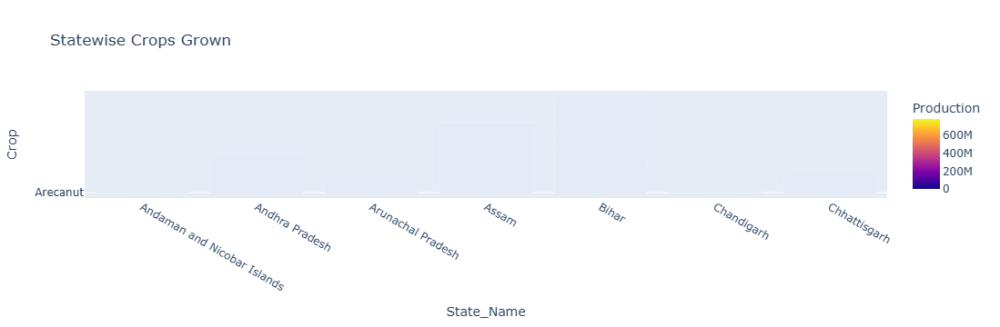

In [78]:
# using plotly
fig = px.bar(df,x='State_Name',y='Crop',title="Statewise Crops Grown",color="Production") #,barmode='group'
fig.show()

### VISUALIZING VIA BAR CHART

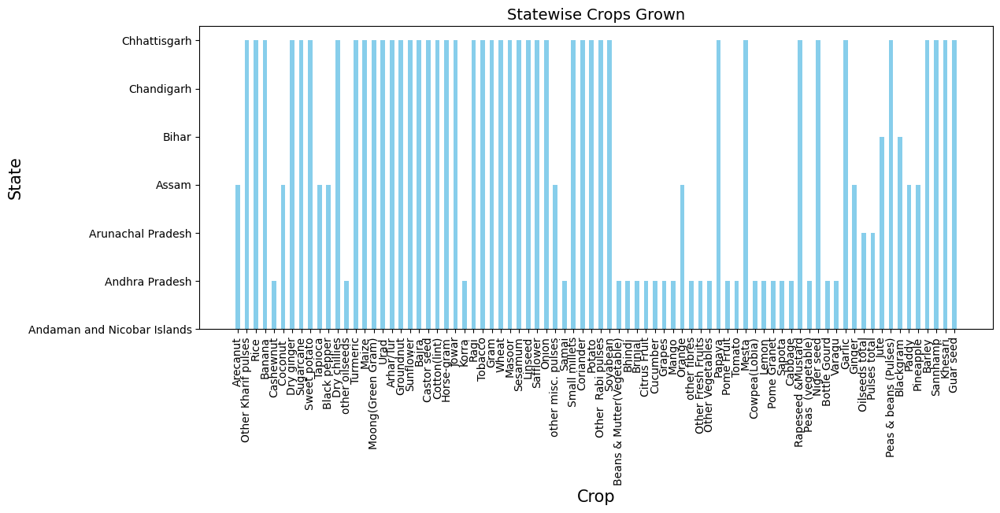

In [79]:
# plt.figure(figsize=(13, 5))
# plt.bar(df.loc[:,"State"], df.loc[:,"Crop"], width=0.5, color = 'skyblue')
# plt.title('Statewise crops grown', fontsize=14)
# plt.xlabel('State', fontsize=30)
# plt.ylabel('Crops', fontsize=30)
# plt.xticks(rotation=45)
# # plt.tight_layout()
# plt.show()


plt.figure(figsize=(13, 5))
plt.bar(df.loc[:,"Crop"], df.loc[:,"State_Name"], width=0.5, color = 'skyblue')
plt.title('Statewise Crops Grown', fontsize=14)
plt.xlabel('Crop', fontsize=15)
plt.ylabel('State', fontsize=15)
plt.xticks(rotation=90)
# plt.tight_layout()
plt.show()

In [81]:
# STATEWISE - RAINFALL

# plt.figure(figsize=(13, 5))
# plt.bar(df.loc[:,"Rainfall"], df.loc[:,"State_Name"], width=0.5, color = 'green')
# plt.title('Statewise Rainfall', fontsize=14)
# plt.xlabel('Rainfall', fontsize=15)
# plt.ylabel('State', fontsize=15)
# plt.xticks(rotation=90)
# # plt.tight_layout()
# plt.show()

In [23]:
#UNIQUE CROPS

total_crops = df["Crop"].count()
print("Total number of crop values:", total_crops)

# Count unique crop types
unique_crops = df["Crop"].nunique()
print("Total unique crop types:", unique_crops)

# Show count of each crop
crop_counts = df["Crop"].value_counts()
print("\nCrop-wise count:\n", crop_counts)

Total number of crop values: 49784
Total unique crop types: 80

Crop-wise count:
 Crop
Rice                 3851
Maize                3248
Moong(Green Gram)    2074
Dry chillies         1593
Arhar/Tur            1576
                     ... 
Grapes                 17
Varagu                 13
Peas  (vegetable)       3
other fibres            2
Guar seed               1
Name: count, Length: 80, dtype: int64


In [25]:
#CREATING A MINI DATASET FOR RICE ONLY AS WE WILL PREDICT RICE PRODUCTION

df_rice = df[df['Crop'] == 'Rice']
df_rice

,State_Name,District_Name,Crop_Year,Season,Crop,Temperature,Humidity,Soil_Moisture,Area,Production
2,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Rice,36,41,50,102.00,321.00
12,Andaman and Nicobar Islands,NICOBARS,2001,Kharif,Rice,37,42,55,83.00,300.00
18,Andaman and Nicobar Islands,NICOBARS,2002,Kharif,Rice,36,35,45,189.20,510.84
27,Andaman and Nicobar Islands,NICOBARS,2003,Kharif,Rice,36,35,45,52.00,90.17
36,Andaman and Nicobar Islands,NICOBARS,2004,Kharif,Rice,36,35,45,52.94,72.57
...,...,...,...,...,...,...,...,...,...,...
49629,Chhattisgarh,JANJGIR-CHAMPA,2002,Kharif,Rice,25,55,55,252737.00,299041.00
49666,Chhattisgarh,JANJGIR-CHAMPA,2003,Kharif,Rice,36,35,45,253178.00,341989.00
49704,Chhattisgarh,JANJGIR-CHAMPA,2004,Kharif,Rice,36,41,50,253093.00,314469.00
49740,Chhattisgarh,JANJGIR-CHAMPA,2005,Kharif,Rice,34,55,62,253737.00,452873.00


In [27]:
print("Total number of Rice Crop Values:", df_rice["Crop"].count())
# len(df_rice)

Total number of Rice Crop Values: 3851


In [29]:

duplicates = df_rice[df_rice.duplicated()] 
print(duplicates)

Empty DataFrame
Columns: [State_Name, District_Name, Crop_Year, Season, Crop, Temperature, Humidity, Soil_Moisture, Area, Production]
Index: []


In [31]:
df_rice

,State_Name,District_Name,Crop_Year,Season,Crop,Temperature,Humidity,Soil_Moisture,Area,Production
2,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Rice,36,41,50,102.00,321.00
12,Andaman and Nicobar Islands,NICOBARS,2001,Kharif,Rice,37,42,55,83.00,300.00
18,Andaman and Nicobar Islands,NICOBARS,2002,Kharif,Rice,36,35,45,189.20,510.84
27,Andaman and Nicobar Islands,NICOBARS,2003,Kharif,Rice,36,35,45,52.00,90.17
36,Andaman and Nicobar Islands,NICOBARS,2004,Kharif,Rice,36,35,45,52.94,72.57
...,...,...,...,...,...,...,...,...,...,...
49629,Chhattisgarh,JANJGIR-CHAMPA,2002,Kharif,Rice,25,55,55,252737.00,299041.00
49666,Chhattisgarh,JANJGIR-CHAMPA,2003,Kharif,Rice,36,35,45,253178.00,341989.00
49704,Chhattisgarh,JANJGIR-CHAMPA,2004,Kharif,Rice,36,41,50,253093.00,314469.00
49740,Chhattisgarh,JANJGIR-CHAMPA,2005,Kharif,Rice,34,55,62,253737.00,452873.00


### OVERALL PRODUCTION OVER THE YEARS

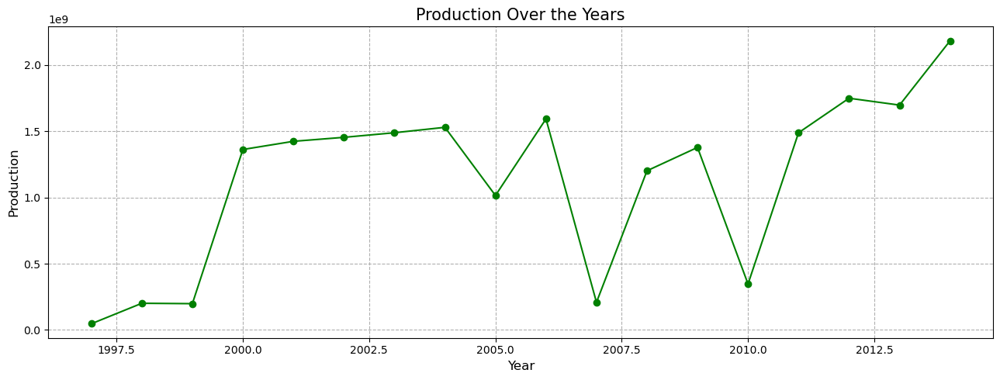

In [86]:
# Group by Year and sum the Production values


# ============
# PLOT 1
# ============
# rice_production = df_rice.groupby("Year")["Production"].sum().reset_index()

# # Plot the graph
# plt.figure(figsize=(10, 5))
# plt.plot(rice_production["Year"], rice_production["Production"], marker="o", linestyle="-", color="green", label="Rice Production")

# # Customize the graph
# plt.xlabel("Year")
# plt.ylabel("Rice Production (in tonnes)")
# plt.title("Rice Production Over the Years")
# plt.grid(True)
# plt.legend()
# plt.xticks(rotation=45)  # Rotate years for better visibility

# # Show the graph
# plt.show()






# ============
#   PLOT 2
# ============
plt.figure(figsize=(13, 5))

production_by_year = df.groupby('Crop_Year')['Production'].sum()


plt.plot(production_by_year.index, production_by_year.values, marker='o', color='green')


plt.title('Production Over the Years', fontsize = 15) 


plt.xlabel('Year', fontsize = 12)
plt.ylabel('Production', fontsize = 12)
plt.grid(True, linestyle = '--', alpha = 1.0)
plt.tight_layout()

plt.show()


### RICE PRODUCTION BY STATES

In [33]:
df_rice

,State_Name,District_Name,Crop_Year,Season,Crop,Temperature,Humidity,Soil_Moisture,Area,Production
2,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Rice,36,41,50,102.00,321.00
12,Andaman and Nicobar Islands,NICOBARS,2001,Kharif,Rice,37,42,55,83.00,300.00
18,Andaman and Nicobar Islands,NICOBARS,2002,Kharif,Rice,36,35,45,189.20,510.84
27,Andaman and Nicobar Islands,NICOBARS,2003,Kharif,Rice,36,35,45,52.00,90.17
36,Andaman and Nicobar Islands,NICOBARS,2004,Kharif,Rice,36,35,45,52.94,72.57
...,...,...,...,...,...,...,...,...,...,...
49629,Chhattisgarh,JANJGIR-CHAMPA,2002,Kharif,Rice,25,55,55,252737.00,299041.00
49666,Chhattisgarh,JANJGIR-CHAMPA,2003,Kharif,Rice,36,35,45,253178.00,341989.00
49704,Chhattisgarh,JANJGIR-CHAMPA,2004,Kharif,Rice,36,41,50,253093.00,314469.00
49740,Chhattisgarh,JANJGIR-CHAMPA,2005,Kharif,Rice,34,55,62,253737.00,452873.00


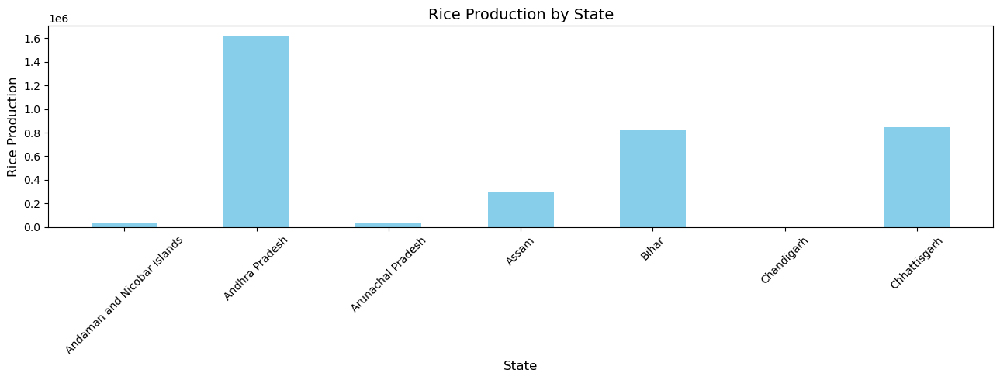

In [706]:
plt.figure(figsize=(13, 5))

plt.bar(df_rice.loc[:,"State_Name"], df_rice.loc[:,"Production"], width=0.5, color = 'skyblue')
plt.title('Rice Production by State', fontsize=14)
plt.xlabel('State', fontsize=12)
plt.ylabel('Rice Production', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [35]:
# print("Total number of States present in dataset are :", df_rice["State"].count())

# Count unique crop types
unique_states = df_rice["State_Name"].unique()
print("\n===============================================\n")
print("1 - (a) Total unique States :", unique_states)


state_counts = df_rice["State_Name"].value_counts()
print("\n1 - (b)State-wise count: \n", state_counts)

unique_states_count = df_rice["State_Name"].nunique()

print("\n1 - (c) Total unique States :", unique_states_count)




unique_districts = df_rice["District_Name"].unique()
print("\n===============================================\n")
print("2 - (a) Total unique Districts :", unique_districts)

# Show count of each crop
district_counts = df_rice["District_Name"].value_counts()
print("\n2 - (b) District-wise count: \n", district_counts)

unique_district_count = df_rice["District_Name"].nunique()
print("\n2 - (c) Total unique Districts :", unique_district_count)




unique_seasons = df_rice["Season"].unique()
print("\n===============================================\n")
print("3 - (a) Total unique Seasons :", unique_seasons)

# Show count of each crop
season_counts = df_rice["Season"].value_counts()
print("\n3 - (b) Season-wise count: \n", season_counts)

unique_season_count = df_rice["Season"].nunique()
print("\n3 - (c) Total unique Seasons :", unique_season_count)




unique_temperatures = df_rice["Temperature"].unique()
print("\n===============================================\n")
print("4 - (a) Total unique Temparatures :", unique_temperatures)

# Show count of each crop
temperature_counts = df_rice["Temperature"].value_counts()
print("\n4 - (b) Temparature-wise count: \n", temperature_counts)

unique_temp_count = df_rice["Temperature"].nunique()
print("\n4 - (c) Total unique Temparatures :", unique_temp_count)




1 - (a) Total unique States : ['Andaman and Nicobar Islands' 'Andhra Pradesh' 'Arunachal Pradesh'
 'Assam' 'Bihar' 'Chandigarh' 'Chhattisgarh']

1 - (b)State-wise count: 
 State_Name
Bihar                          1601
Assam                          1356
Andhra Pradesh                  481
Arunachal Pradesh               273
Chhattisgarh                    110
Andaman and Nicobar Islands      17
Chandigarh                       13
Name: count, dtype: int64

1 - (c) Total unique States : 7


2 - (a) Total unique Districts : ['NICOBARS' 'NORTH AND MIDDLE ANDAMAN' 'SOUTH ANDAMANS' 'ANANTAPUR'
 'CHITTOOR' 'EAST GODAVARI' 'GUNTUR' 'KADAPA' 'KRISHNA' 'KURNOOL'
 'PRAKASAM' 'SPSR NELLORE' 'SRIKAKULAM' 'VISAKHAPATANAM' 'VIZIANAGARAM'
 'WEST GODAVARI' 'ANJAW' 'CHANGLANG' 'DIBANG VALLEY' 'EAST KAMENG'
 'EAST SIANG' 'KURUNG KUMEY' 'LOHIT' 'LONGDING' 'LOWER DIBANG VALLEY'
 'LOWER SUBANSIRI' 'PAPUM PARE' 'TAWANG' 'TIRAP' 'UPPER SIANG'
 'UPPER SUBANSIRI' 'WEST KAMENG' 'WEST SIANG' 'BAKSA' 'BARPETA'

# STATEWISE PRODUCTION (OF RICE) OVER YEARS

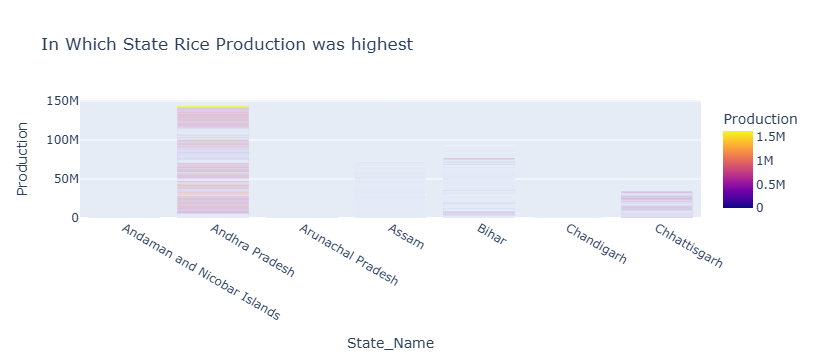

In [710]:
# using plotly
# fig = px.bar(df_rice,x='Crop_Year',y='Production',title="Statewise Production over Years",color="State_Name") #,barmode='group'
# fig.show()


fig = px.bar(df_rice, x='State_Name', y='Production', title="In Which State Rice Production was highest", color="Production")  # ,color="Crop"  , barmode='group'
fig.show()

### STATEWISE - SEASONS OVER YEARS

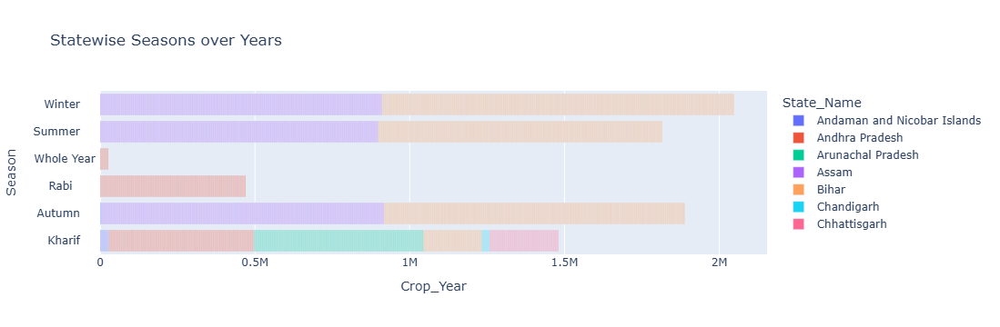

In [712]:

fig = px.bar(df_rice,x='Crop_Year',y='Season',title="Statewise Seasons over Years ",color="State_Name")
fig.show()

### STATEWISE - SEASON OCCURING

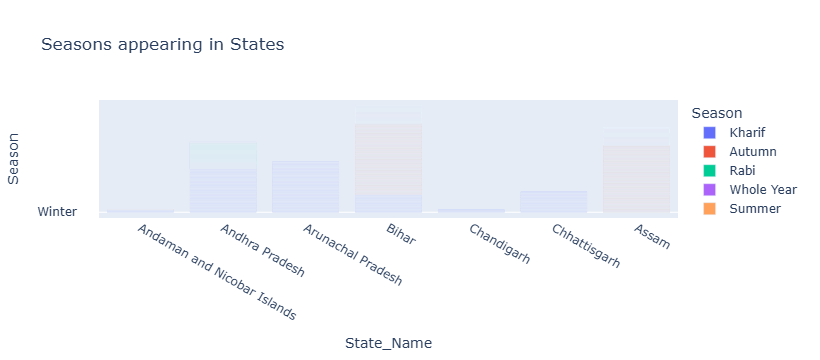

In [714]:
# STATEWISE - SEASON OCCURING
# using plotly

fig = px.bar(df_rice,x='State_Name',y='Season',title="Seasons appearing in States",color="Season") #,barmode='group'
fig.show()


In [37]:
df_rice

,State_Name,District_Name,Crop_Year,Season,Crop,Temperature,Humidity,Soil_Moisture,Area,Production
2,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Rice,36,41,50,102.00,321.00
12,Andaman and Nicobar Islands,NICOBARS,2001,Kharif,Rice,37,42,55,83.00,300.00
18,Andaman and Nicobar Islands,NICOBARS,2002,Kharif,Rice,36,35,45,189.20,510.84
27,Andaman and Nicobar Islands,NICOBARS,2003,Kharif,Rice,36,35,45,52.00,90.17
36,Andaman and Nicobar Islands,NICOBARS,2004,Kharif,Rice,36,35,45,52.94,72.57
...,...,...,...,...,...,...,...,...,...,...
49629,Chhattisgarh,JANJGIR-CHAMPA,2002,Kharif,Rice,25,55,55,252737.00,299041.00
49666,Chhattisgarh,JANJGIR-CHAMPA,2003,Kharif,Rice,36,35,45,253178.00,341989.00
49704,Chhattisgarh,JANJGIR-CHAMPA,2004,Kharif,Rice,36,41,50,253093.00,314469.00
49740,Chhattisgarh,JANJGIR-CHAMPA,2005,Kharif,Rice,34,55,62,253737.00,452873.00


### STATEWISE - TEMPERATURE in °C VARIYING OVER YEARS

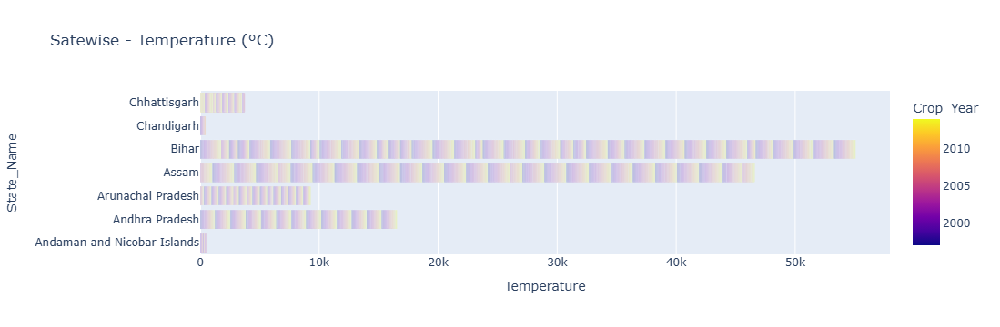

In [718]:
# using plotly
fig = px.bar(df_rice,x='Temperature',y='State_Name',title="Satewise - Temperature (°C)",color="Crop_Year") #,barmode='group'
fig.show()

### STATEWISE - HUMIDITY OVER YEARS

In [110]:
# using plotly
fig = px.bar(df_rice,x='State_Name',y='Humidity',title="Satewise - Humidity",color="Crop_Year") #,barmode='group'
fig.show()


# fig = px.bar(df_rice,x='Humidity',y='State_Name',title="Satewise - Humidity",color="Crop_Year") #,barmode='group'


### STATEWISE - AREA DISTRIBUTION OVER YEARS (or) WHICH STATE HAS HIGHEST AREA !

In [166]:
# using plotly
fig = px.bar(df_rice,x='Area',y='State_Name',title="Statewise Area Distribution (OR) Which State has Highest Area Over Years",color="Crop_Year") #,barmode='group'
fig.show()


# fig = px.bar(df_rice, x='Area', y='State_Name', title="Which State has highest Area", color="Area") #, barmode='group'
# fig.show()

### YEAR VS SEASON

In [116]:
fig = px.bar(df_rice,x='Season',y='Crop_Year',title="Seasons Over Years",color="Crop_Year") #,barmode='group'
fig.show()

### YEAR VS TEMP.

In [120]:
fig = px.bar(df_rice,x='Crop_Year',y='Temperature',title="Temperature over Years",color="Temperature") #,barmode='group'
fig.show()


### YEAR VS HUMIDITY

In [121]:
fig = px.bar(df_rice,x='Crop_Year',y='Humidity',title="Humidity over Years",color="Humidity") #,barmode='group'
fig.show()


### YEAR VS SOIL MOISTURE

In [122]:
fig = px.bar(df_rice,x='Crop_Year',y='Soil_Moisture',title="Soil_Moisture over Years",color="Soil_Moisture") #,barmode='group'
fig.show()

### YEAR VS AREA

In [123]:
fig = px.bar(df_rice,x='Crop_Year',y='Area',title="Area over Years",color="Area") #,barmode='group'
fig.show()

### SEASONWISE - TEMPERATURE

In [127]:
fig = px.bar(df_rice,x='Temperature',y='Season',title="Seasonwise Temperature",color="Temperature") #,barmode='group'
fig.show()

### SEASONWISE - HUMIDITY

In [129]:
fig = px.bar(df_rice,x='Humidity',y='Season',title="Seasonwise Humidity",color="Humidity") #,barmode='group'
fig.show()

### SEASONWISE - SOIL MOISTURE

In [130]:
fig = px.bar(df_rice,x='Soil_Moisture',y='Season',title="Seasonwise Soil_Moisture",color="Soil_Moisture") #,barmode='group'
fig.show()

# In Which Season Rice Production was Highest ?

## SEASON VS PRODUCTION(RICE CROP)

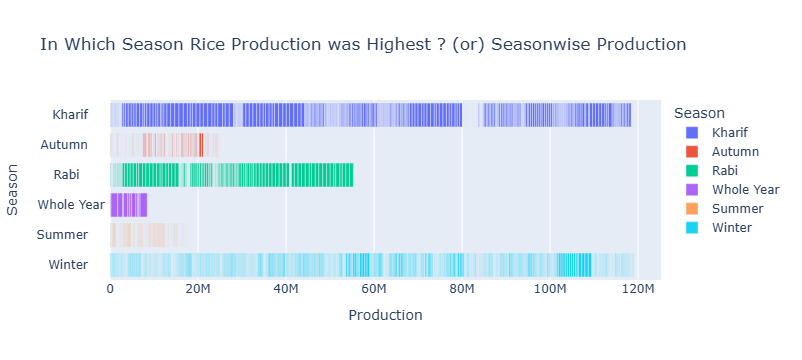

In [727]:
# using plotly
# Problem: "Season" is categorical (e.g., Kharif, Rabi, etc.), and it should not be on the y-axis.
# Fix: Swap y='Season' with y='Production' (or any numerical column).

# fig = px.bar(df_rice,x='Crop',y='Season',title="Rice Grown/Production according to Seasons",color="Season") #,barmode='group'
# fig = px.bar(df_rice, x='Season', y='Production', title="In Which Season Rice Production was Highest ?", color="Season", barmode='group')
# fig.show()


fig = px.bar(df_rice,x='Production',y='Season',title="In Which Season Rice Production was Highest ? (or) Seasonwise Production",color="Season") #,barmode='group'
fig.show()

# In Which District Rice Production was Highest ?

## District names  VS PRODUCTION(RICE CROP)

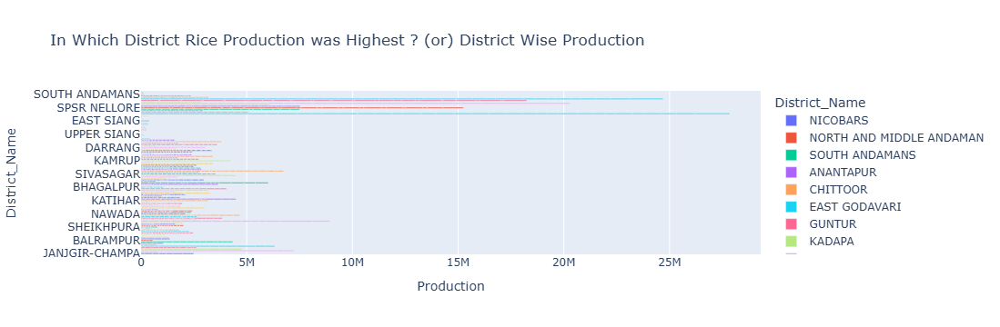

In [729]:

fig = px.bar(df_rice,x='Production',y='District_Name',title="In Which District Rice Production was Highest ? (or) District Wise Production",color="District_Name") #,barmode='group'
fig.show()

### TEMPERATURE EFFECT ON HUMIDITY

In [143]:
# fig = px.bar(df_rice, x='Season', y='Rainfall', title="In which Season Rainfall is Highest ?", color="Season") #, barmode='group'
# fig.show()


# fig = px.bar(df_rice,x='Temperature',y='Humidity',title="Temperature effect on Humidity",color="Temperature") #,barmode='group'
# fig.show()


fig = px.bar(df_rice,x='Humidity',y='Temperature',title="Temperature effect on Humidity",color="Humidity") #,barmode='group'
fig.show() 


# fig = px.bar(df_rice,x='Humidity',y='Temperature',title="Temperature effect on Humidity",color="Temperature") #,barmode='group'
# fig.show()


### TEMPERATURE EFFECT ON SOIL MOISTURE


In [145]:
fig = px.bar(df_rice,x='Soil_Moisture',y='Temperature',title="Temperature effect on Soil_Moisture",color="Soil_Moisture") #,barmode='group'
fig.show() 

### TEMPERATURE EFFECT ON PRODUCTION


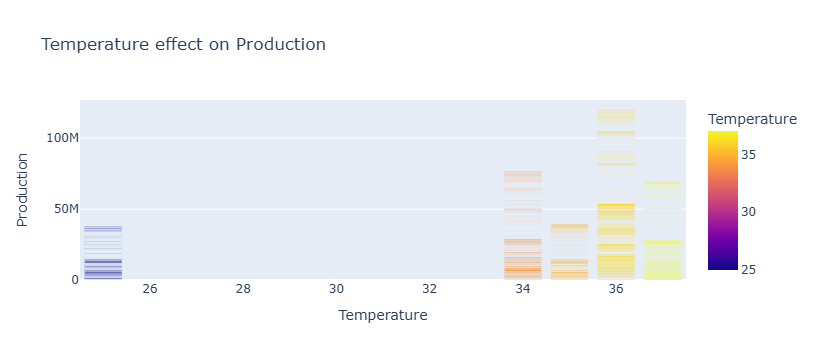

In [731]:
fig = px.bar(df_rice,x='Temperature',y='Production',title="Temperature effect on Production",color="Temperature") #,barmode='group'
fig.show() 

### HUMIDITY EFFECT ON SOIL_MOISTURE

In [157]:
fig = px.bar(df_rice,x='Humidity',y='Soil_Moisture',title="Humidity effect on Soil Moisture",color="Humidity") #,barmode='group'
fig.show() 

### HUMIDITY EFFECT ON PRODUCTION

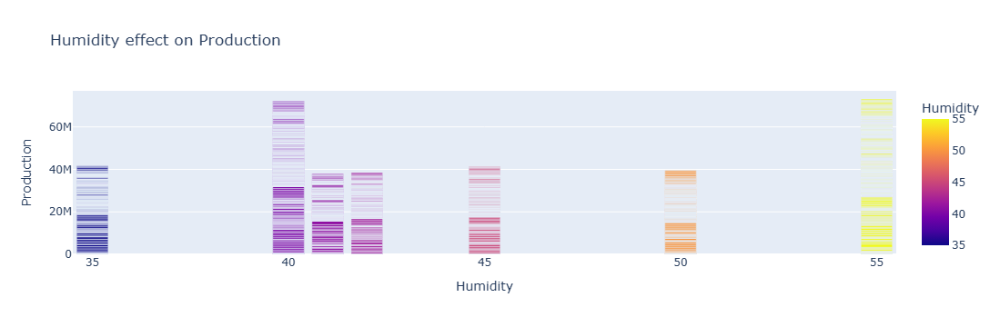

In [733]:
fig = px.bar(df_rice,x='Humidity',y='Production',title="Humidity effect on Production",color="Humidity") #,barmode='group'
fig.show() 

### SOIL MOISTURE IMPACT ON PRODUCTION

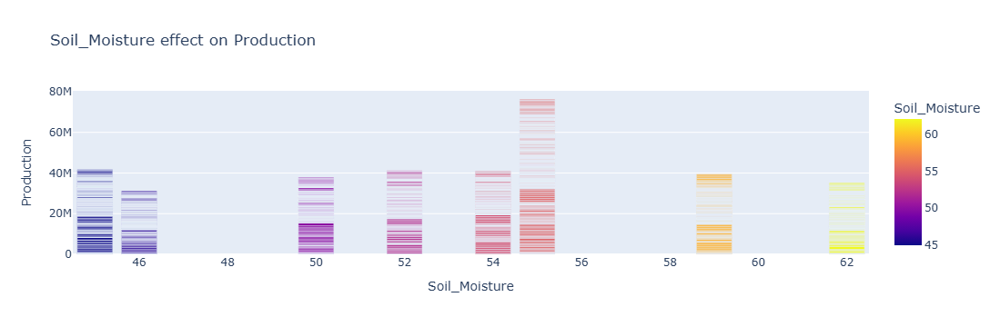

In [735]:
fig = px.bar(df_rice,x='Soil_Moisture',y='Production',title="Soil_Moisture effect on Production",color="Soil_Moisture") #,barmode='group'
fig.show() 

### HIGHEST PRODUCTION IN WHICH YEAR ?

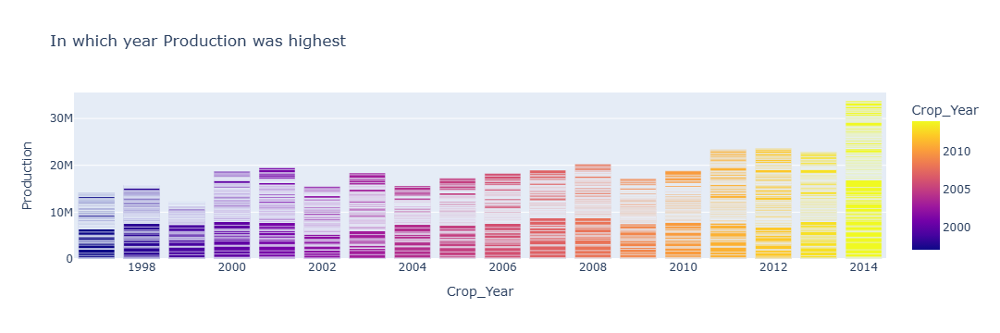

In [737]:
fig = px.bar(df_rice, x='Crop_Year', y='Production', title="In which year Production was highest", color="Crop_Year") #, barmode='group'
fig.show()

## IN WHICH AREA PRODUCTION WAS HIGHEST 


C:\Users\DELL\AppData\Local\Temp\ipykernel_19060\484163147.py:14: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




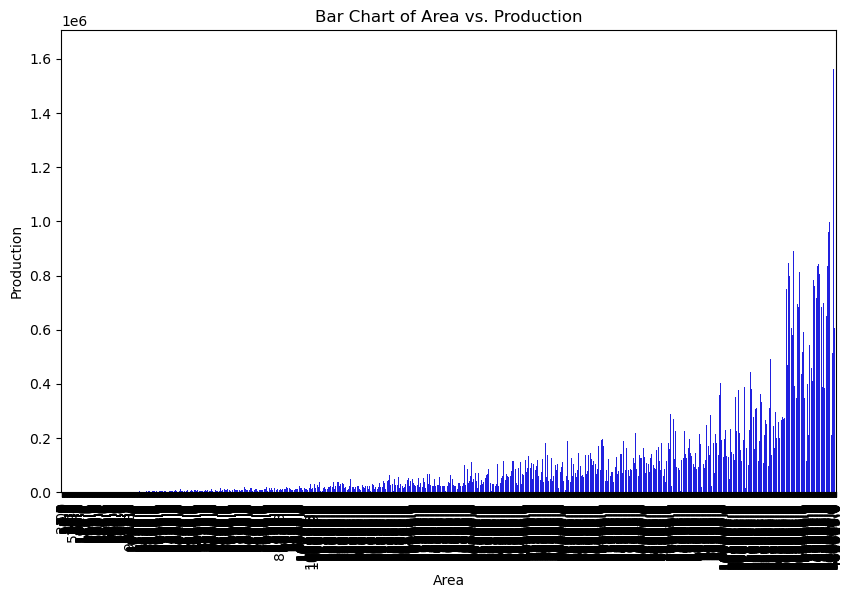

In [754]:
# fig = px.bar(df_rice, x='Production', y='Area', title="In which Area Production was highest", color="Area") #, barmode='group'
# fig.show()



import matplotlib.pyplot as plt
import seaborn as sns

# Sorting data for better visualization
df_sorted = df_rice.sort_values(by='Area')

# Bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x=df_sorted['Area'], y=df_sorted['Production'], ci=None, color='blue')

# Labels and title
plt.xlabel('Area')
plt.ylabel('Production')
plt.title('Bar Chart of Area vs. Production')
plt.xticks(rotation=90)  # Rotate x-axis labels if needed

plt.show()


<!-- IN WHICH YEAR RAINFALL WAS HIGHEST ? -->

In [161]:
# fig = px.bar(df_rice, x='Year', y='Rainfall', title="IN which year Rainfall was highest", color="Rainfall") #, barmode='group'
# fig.show()

In [171]:
# IN WHICH STATE RAINFALL WAS HIGHEST ?
# fig = px.bar(df_rice, x='State', y='Rainfall', title="In Which State Rainfall was highest", color="Rainfall")  # ,color="Crop"  , barmode='group'
# fig.show()

In [39]:
df_rice.head(3)


,State_Name,District_Name,Crop_Year,Season,Crop,Temperature,Humidity,Soil_Moisture,Area,Production
2,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Rice,36,41,50,102.0,321.00
12,Andaman and Nicobar Islands,NICOBARS,2001,Kharif,Rice,37,42,55,83.0,300.00
18,Andaman and Nicobar Islands,NICOBARS,2002,Kharif,Rice,36,35,45,189.2,510.84


In [5]:
# # OUTLIERS , SCATTER PLOT, BOX PLOT , CORRELATION

# # "First find outliers via visualization"

# features = ['Area', 'Production', 'Rainfall'] 
  
# plt.subplots(figsize=(15,10)) 
  
# for i, col in enumerate(features): 
#   plt.subplot(2,3,i+1) 
#   sns.distplot(df_rice[col]) 
# plt.show()


In [6]:
# plt.hist(df_rice['Rainfall'], bins = 10) 
# plt.show()

In [7]:
# # plt.subplots(figsize=(10,5)) 
# sns.displot(df_rice['Rainfall'])   # sns.distplot(df_rice['Rainfall'])  ----------------> isme graph line bhi show krta h 

In [8]:
# sns.pairplot(df_rice, hue ='Production')#, hue ='Open'
# plt.show()

In [10]:
# rice_correlation_df = df_rice[['Year','Area','Production','Rainfall']]

# corr = rice_correlation_df.corr()

# corr

In [11]:
# # sns.heatmap(rice_correlation_df, cmap = 'RdBu', vmin = -1, vmax = 1, annot = True) #, cmap = 'RdBu', vmin = -1, vmax = 1)


# sns.heatmap(rice_correlation_df.corr(), annot =True)
# plt.title('Correlation Matrix')

In [41]:
df_rice.head(4)

,State_Name,District_Name,Crop_Year,Season,Crop,Temperature,Humidity,Soil_Moisture,Area,Production
2,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Rice,36,41,50,102.0,321.00
12,Andaman and Nicobar Islands,NICOBARS,2001,Kharif,Rice,37,42,55,83.0,300.00
18,Andaman and Nicobar Islands,NICOBARS,2002,Kharif,Rice,36,35,45,189.2,510.84
27,Andaman and Nicobar Islands,NICOBARS,2003,Kharif,Rice,36,35,45,52.0,90.17


# SCATTER PLOT VISUALIZATION

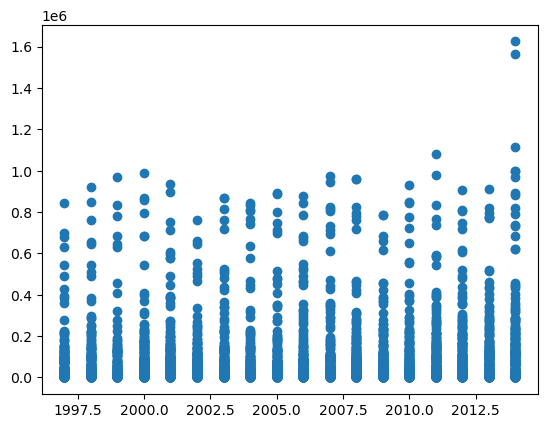

In [758]:
plt.scatter(df_rice["Crop_Year"],df_rice["Production"])

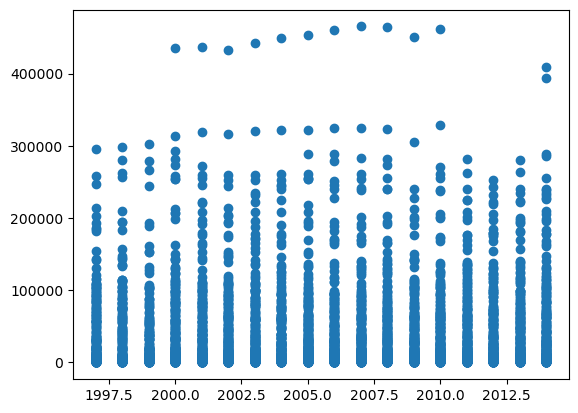

In [760]:
plt.scatter(df_rice["Crop_Year"],df_rice["Area"])

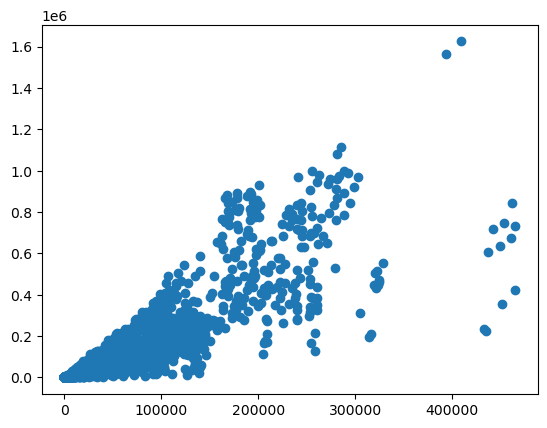

In [781]:
plt.scatter(df_rice["Area"],df_rice["Production"])

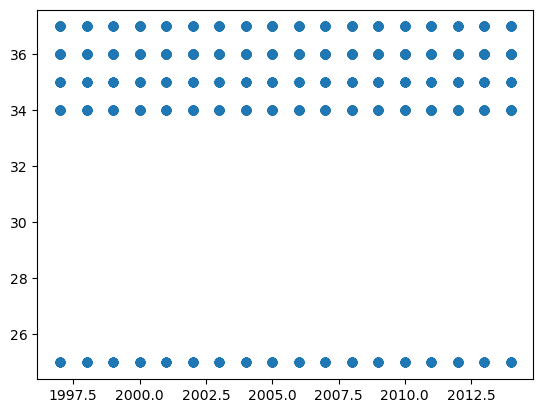

In [764]:
plt.scatter(df_rice["Crop_Year"],df_rice["Temperature"])

### SCATTER PLOT WITH RESPECT TO TARGET VARIABLE !

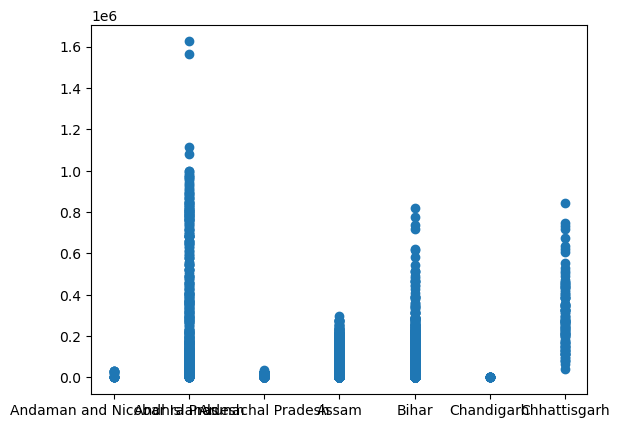

In [767]:
plt.scatter(df_rice["State_Name"],df_rice["Production"])

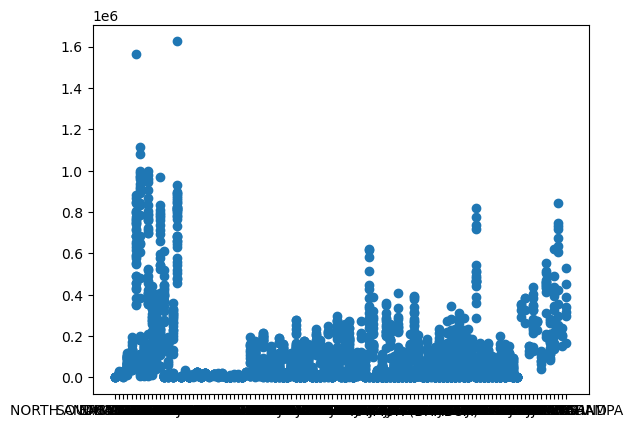

In [769]:
plt.scatter(df_rice["District_Name"],df_rice["Production"])

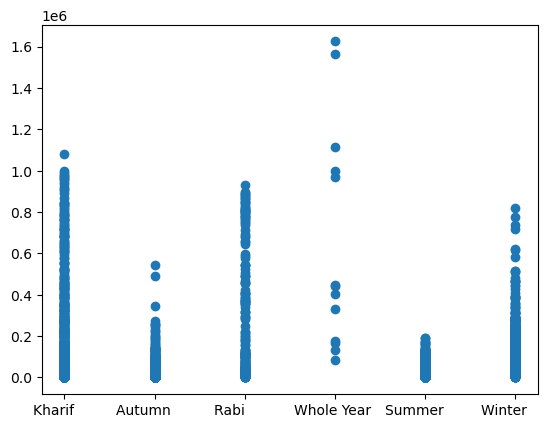

In [771]:
plt.scatter(df_rice["Season"],df_rice["Production"])

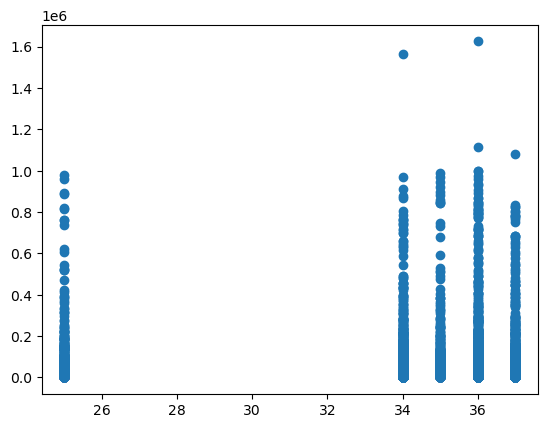

In [773]:
plt.scatter(df_rice["Temperature"],df_rice["Production"])

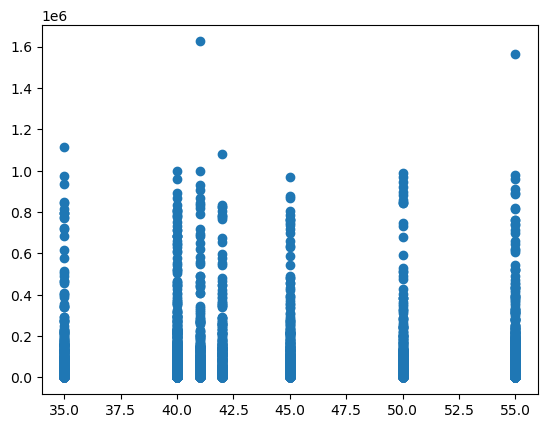

In [775]:
plt.scatter(df_rice["Humidity"],df_rice["Production"])

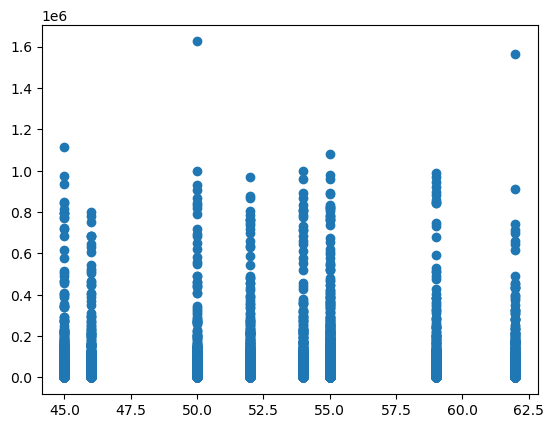

In [777]:
plt.scatter(df_rice["Soil_Moisture"],df_rice["Production"])

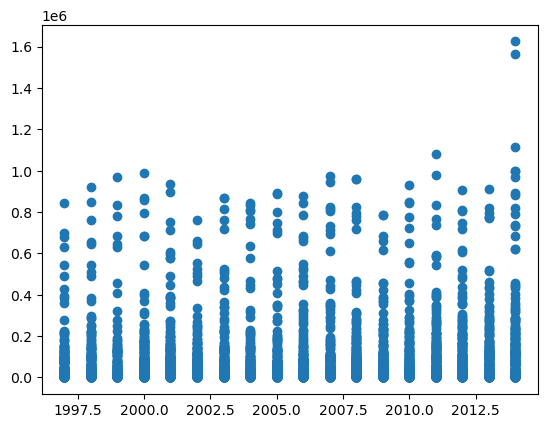

In [779]:
plt.scatter(df_rice["Crop_Year"],df_rice["Production"])

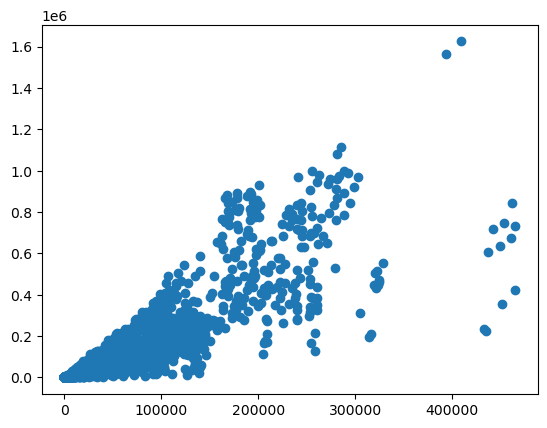

In [783]:
plt.scatter(df_rice["Area"],df_rice["Production"])

## VISUALIZAING CORRELATIONS VIA HEATMAP 

##### (but i should do this after all the data preprocessig since my data is is categorical and high scale range)

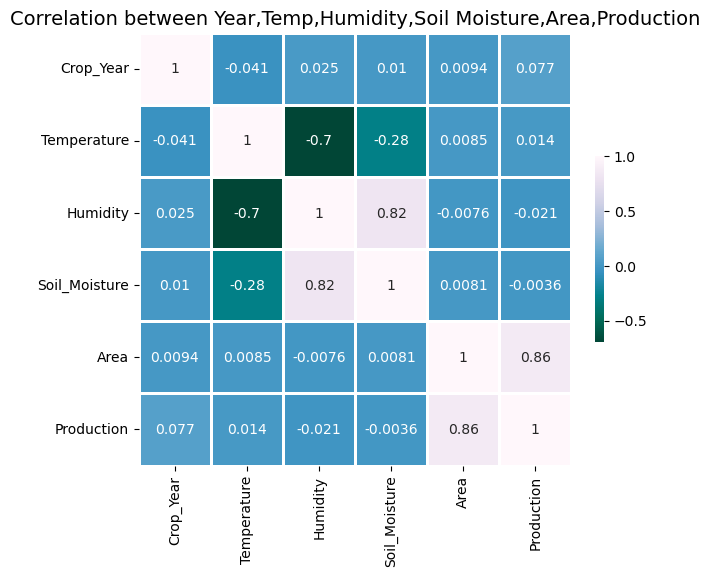

In [43]:
rice_correlation_df = df_rice[['Crop_Year','Temperature','Humidity','Soil_Moisture','Area','Production']]

corr = rice_correlation_df.corr()


plt.figure(figsize=(6,6))


g = sns.heatmap(corr, annot=True, cmap = 'PuBuGn_r', square=True, linewidth=1, cbar_kws={'fraction' : 0.02})

g.set_yticklabels(g.get_yticklabels(), rotation=0, horizontalalignment='right')

g.set_title("Correlation between Year,Temp,Humidity,Soil Moisture,Area,Production", fontsize=14)
#bottom, top = g.get_ylim()
#g.set_ylim(bottom + 0.5, top + 0.5)

plt.show()

# (STEP 2 ) DATA - PREPROCESSING

In [45]:
df_rice.tail()

,State_Name,District_Name,Crop_Year,Season,Crop,Temperature,Humidity,Soil_Moisture,Area,Production
49629,Chhattisgarh,JANJGIR-CHAMPA,2002,Kharif,Rice,25,55,55,252737.0,299041.0
49666,Chhattisgarh,JANJGIR-CHAMPA,2003,Kharif,Rice,36,35,45,253178.0,341989.0
49704,Chhattisgarh,JANJGIR-CHAMPA,2004,Kharif,Rice,36,41,50,253093.0,314469.0
49740,Chhattisgarh,JANJGIR-CHAMPA,2005,Kharif,Rice,34,55,62,253737.0,452873.0
49777,Chhattisgarh,JANJGIR-CHAMPA,2006,Kharif,Rice,35,50,59,278916.0,528694.0


In [47]:
print(df_rice.isnull().sum())  # Check missing values


State_Name       0
District_Name    0
Crop_Year        0
Season           0
Crop             0
Temperature      0
Humidity         0
Soil_Moisture    0
Area             0
Production       0
dtype: int64


In [792]:
# # Adding a new column Yield which indicates Production per unit Area. 

# df_rice['Yield'] = (df_rice['Production'] / df_rice['Area'])
# df_rice.tail() 



In [49]:
df_rice.head(2)

,State_Name,District_Name,Crop_Year,Season,Crop,Temperature,Humidity,Soil_Moisture,Area,Production
2,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,Rice,36,41,50,102.0,321.0
12,Andaman and Nicobar Islands,NICOBARS,2001,Kharif,Rice,37,42,55,83.0,300.0


In [51]:
rice_dataframe_withoutCrop = df_rice.drop(("Crop"),axis = 1)

rice_dataframe_withoutCrop.tail()

,State_Name,District_Name,Crop_Year,Season,Temperature,Humidity,Soil_Moisture,Area,Production
49629,Chhattisgarh,JANJGIR-CHAMPA,2002,Kharif,25,55,55,252737.0,299041.0
49666,Chhattisgarh,JANJGIR-CHAMPA,2003,Kharif,36,35,45,253178.0,341989.0
49704,Chhattisgarh,JANJGIR-CHAMPA,2004,Kharif,36,41,50,253093.0,314469.0
49740,Chhattisgarh,JANJGIR-CHAMPA,2005,Kharif,34,55,62,253737.0,452873.0
49777,Chhattisgarh,JANJGIR-CHAMPA,2006,Kharif,35,50,59,278916.0,528694.0


In [225]:
# from sklearn.preprocessing import OneHotEncoder
# from sklearn.compose import ColumnTransformer

# # Define categorical columns
# categorical_cols = ['State_Name', 'District_Name', 'Season']

# # Create OneHotEncoder instance
# encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# # Apply OneHotEncoding using ColumnTransformer
# preprocessor = ColumnTransformer(
#     transformers=[('OHE_STATE_DISTRICT_SEASON', encoder, categorical_cols)],
#     remainder='passthrough'  # Keep other columns unchanged
# )

# # Transform the data
# df_encoded_array = preprocessor.fit_transform(rice_dataframe_withoutCrop)

# # Convert the NumPy array back to a DataFrame
# encoded_feature_names = preprocessor.get_feature_names_out()
# df_encoded = pd.DataFrame(df_encoded_array, columns=encoded_feature_names)

# # Display the first few rows
# # df_encoded.head()

# # df_encoded.tail()

# df_encoded

In [227]:
# print(df_encoded.columns)


In [796]:
# rice_dataframe_withoutCrop.head(2)

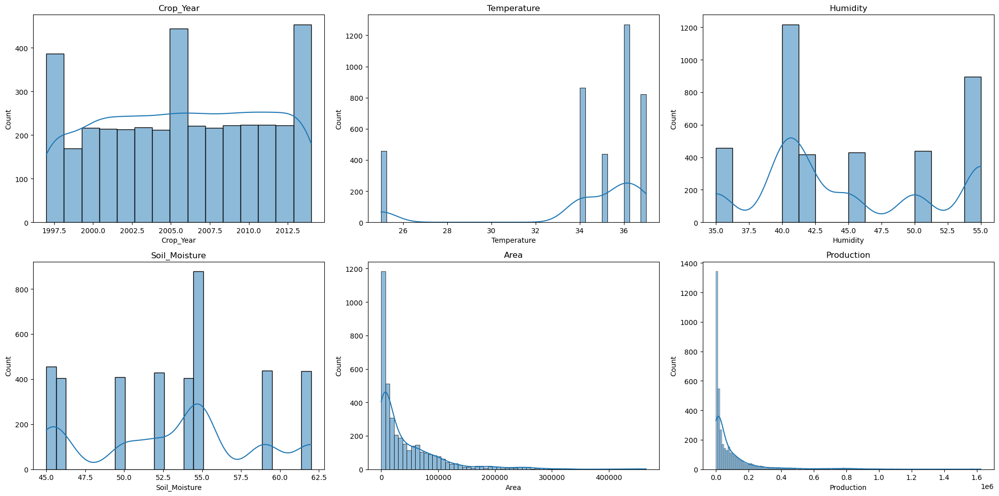

In [804]:
# # "First find outliers via visualization"

# # features = ['Crop_Year','Temperature','Humidity','Soil_Moisture','Area','Production','Yield'] #:--> ye jab mera target vairable yeild tha now its production !!!


  
# # plt.subplots(figsize=(20,10)) 
  
# # for i, col in enumerate(features): 
# #   plt.subplot(2,3,i+1) 
# #   sns.distplot(rice_dataframe_withoutCrop[col]) 
# # plt.show()


# rows = int(np.ceil(len(features) / 3))  # Automatically calculate rows needed
# plt.figure(figsize=(20, 10))  

# for i, col in enumerate(features):
#     plt.subplot(rows, 3, i+1)  # Dynamically adjust row count
#     sns.histplot(rice_dataframe_withoutCrop[col], kde=True)
#     plt.title(col)

# plt.tight_layout()
# plt.show()




# =============================================================================================================================================================================================================================
features = ['Crop_Year','Temperature','Humidity','Soil_Moisture','Area','Production']



rows = int(np.ceil(len(features) / 3))  # Automatically calculate rows needed
plt.figure(figsize=(20, 10))  

for i, col in enumerate(features):
    plt.subplot(rows, 3, i+1)  # Dynamically adjust row count
    sns.histplot(rice_dataframe_withoutCrop[col], kde=True)
    plt.title(col)

plt.tight_layout()
plt.show()


## "Visualizing Temperature"

C:\Users\DELL\AppData\Local\Temp\ipykernel_19060\466649916.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='Temperature', ylabel='Density'>

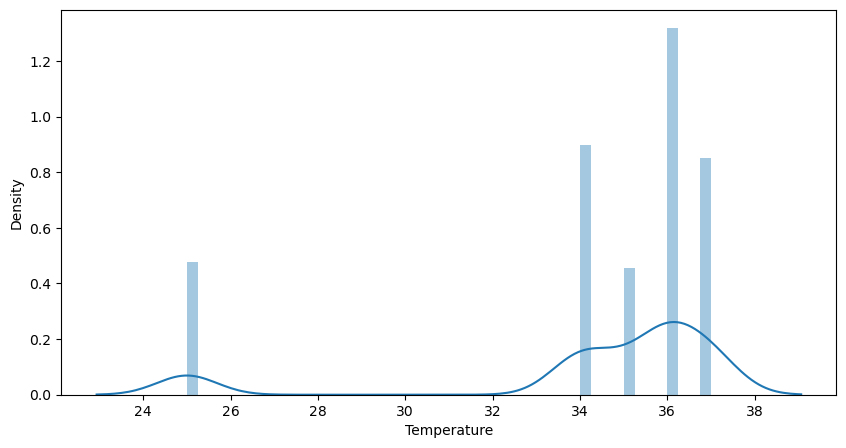

In [807]:
plt.subplots(figsize=(10,5)) 
sns.distplot(rice_dataframe_withoutCrop['Temperature']) 

## "Visualizing Area"

C:\Users\DELL\AppData\Local\Temp\ipykernel_19060\4053598584.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='Area', ylabel='Density'>

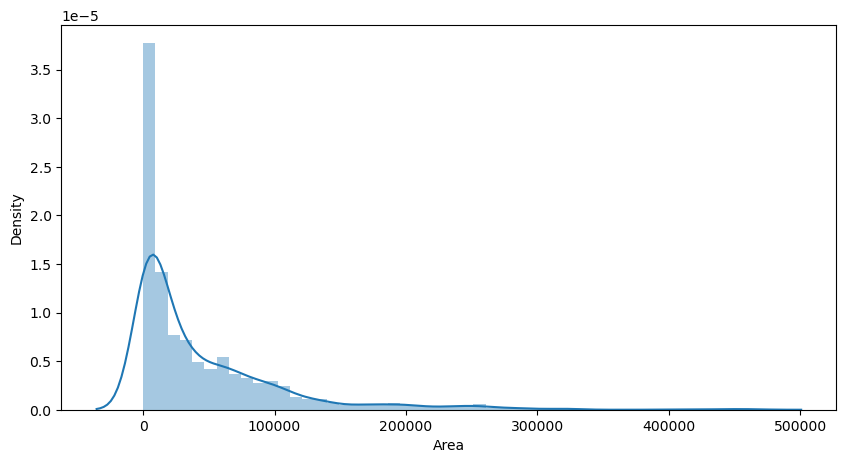

In [809]:
plt.subplots(figsize=(10,5)) 
sns.distplot(rice_dataframe_withoutCrop['Area']) 

## "Visualizing Production"

C:\Users\DELL\AppData\Local\Temp\ipykernel_19060\755915781.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='Production', ylabel='Density'>

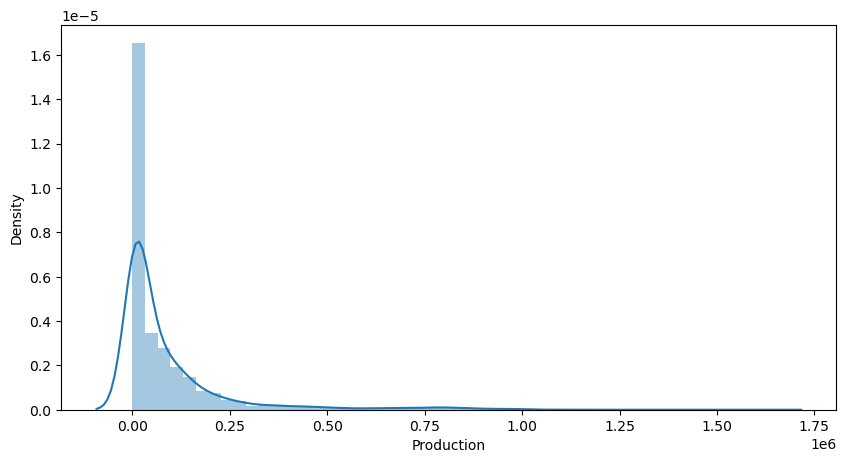

In [811]:
plt.subplots(figsize=(10,5)) 
sns.distplot(rice_dataframe_withoutCrop['Production']) 

In [815]:
## "Visualizing Yield"

In [817]:
# plt.subplots(figsize=(10,5)) 
# sns.distplot(rice_dataframe_withoutCrop['Yield']) 

# Creating "Box - Plot"

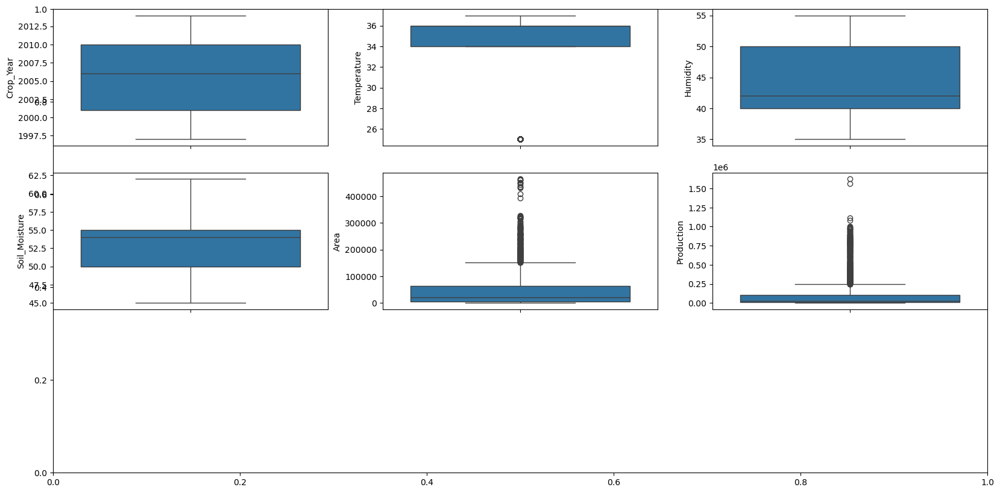

In [53]:
plt.subplots(figsize=(20,10)) 

# State_Name	District_Name	Crop_Year	Season	Temperature	Humidity	Soil_Moisture	Area	Production	Yield
# features = ['Crop_Year','Temperature','Humidity','Soil_Moisture','Area','Production','Yield']
features = ['Crop_Year','Temperature','Humidity','Soil_Moisture','Area','Production']

for i, col in enumerate(features): 
  plt.subplot(3,3,i+1) 
  sns.boxplot(rice_dataframe_withoutCrop[col]) 
plt.show()


# plt.figure(figsize=(20, 10))
# features = ['Crop_Year', 'Temperature', 'Humidity', 'Soil_Moisture', 'Area', 'Production', 'Yield']

# for i, col in enumerate(features): 
#     plt.subplot(3, 3, i+1)  # Use (3,3) instead of (2,3)
#     sns.boxplot(x=rice_dataframe_withoutCrop[col]) 
#     plt.title(col)  # Add titles for better understanding

# plt.tight_layout()  # Adjust layout to avoid overlapping
# plt.show()


# "Removing Outliers "

In [55]:
# # lowerLimit = df['Volume'].quantile(0.05) #means 5%
# # print("\nLower Limit is:- " + str(lowerLimit))
# # # df[df['Volume'] < lowerLimit]

# # upperLimit = df['Volume'].quantile(0.95) #means 95%
# # print("\nUpper Limit is:- " + str(upperLimit) + "\n")
# # # df[df['Volume'] > upperLimit]

# # dataset_with_values_btw_lower_upper = df[ (df['Volume'] > lowerLimit) & (df['Volume'] < upperLimit) ]


# # Function to remove outliers using IQR
# def remove_outliers_iqr(df, columns):
#     Q1 = df[columns].quantile(0.25)
#     Q3 = df[columns].quantile(0.75)
#     IQR = Q3 - Q1
#     lower_bound = Q1 - 3.5 * IQR
#     upper_bound = Q3 + 3.5 * IQR
#     return df[~((df[columns] < lower_bound) | (df[columns] > upper_bound)).any(axis=1)]

# # Function to remove outliers using Z-score
# from scipy.stats import zscore

# def remove_outliers_zscore(df, columns, threshold=3):
#     z_scores = np.abs(zscore(df[columns]))
#     return df[(z_scores < threshold).all(axis=1)]




# # Apply IQR on skewed features
# skewed_features = ['Temperature','Area','Production','Yield']
# df_cleaned = remove_outliers_iqr(rice_dataframe_withoutCrop, skewed_features)





# # # Apply Z-score on normally distributed features
# # normal_features = ['Crop_Year','Humidity','Soil_Moisture']
# # df_cleaned = remove_outliers_zscore(df_cleaned, normal_features)




# print(f"Original Data: {rice_dataframe_withoutCrop.shape} | After Outlier Removal: {df_cleaned.shape}")









# # -=================================================================================
# import numpy as np
# import pandas as pd

# def remove_outliers_iqr(df, columns):
#     df_out = df.copy()
    
#     for col in columns:
#         Q1 = df_out[col].quantile(0.25)
#         Q3 = df_out[col].quantile(0.75)
#         IQR = Q3 - Q1
#         skewness = df_out[col].skew()
        
#         # Right-skewed (e.g., Temperature)
#         if skewness > 0.5:
#             lower_bound = Q1 - 1.5 * IQR   # Standard lower bound
#             upper_bound = Q3 + 3.5 * IQR   # Less aggressive removal on upper side
        
#         # Highly Left-skewed (e.g., Area, Production)
#         elif skewness < -0.5:
#             lower_bound = Q1 - 4.0 * IQR   # More tolerance for left outliers
#             upper_bound = Q3 + 1.5 * IQR   # Standard upper bound
        
#         # Mildly Left-skewed (e.g., Yield)
#         else:
#             lower_bound = Q1 - 3.0 * IQR   # Standard removal
#             upper_bound = Q3 + 3.0 * IQR

#         # Apply filtering
#         df_out = df_out[(df_out[col] >= lower_bound) & (df_out[col] <= upper_bound)]
    
#     return df_out

# # Define specific features based on skewness type
# right_skewed = ['Temperature']
# highly_left_skewed = ['Area', 'Production']
# mildly_left_skewed = ['Yield']

# # Apply outlier removal
# df_cleaned = remove_outliers_iqr(rice_dataframe_withoutCrop, right_skewed + highly_left_skewed + mildly_left_skewed)

# print(f"Original Data: {rice_dataframe_withoutCrop.shape} | After Outlier Removal: {df_cleaned.shape}")







# -=================================================================================# -=================================================================================# -=================================================================================

import numpy as np
import pandas as pd

def remove_outliers_iqr(df, columns):
    df_out = df.copy()
    
    for col in columns:
        Q1 = df_out[col].quantile(0.25)
        Q3 = df_out[col].quantile(0.75)
        IQR = Q3 - Q1
        skewness = df_out[col].skew()
        
        # Right-skewed (e.g., Temperature)
        if skewness > 0.5:
            lower_bound = Q1 - 1.5 * IQR   # Standard lower bound
            upper_bound = Q3 + 3.5 * IQR   # Less aggressive removal on upper side
        
        # Highly Left-skewed (e.g., Area, Production)
        elif skewness < -0.5:
            lower_bound = Q1 - 4.0 * IQR   # More tolerance for left outliers
            upper_bound = Q3 + 1.5 * IQR   # Standard upper bound
        

        # Apply filtering
        df_out = df_out[(df_out[col] >= lower_bound) & (df_out[col] <= upper_bound)]
    
    return df_out

# Define specific features based on skewness type
right_skewed = ['Temperature']
highly_left_skewed = ['Area', 'Production']

# Apply outlier removal
df_cleaned = remove_outliers_iqr(rice_dataframe_withoutCrop, right_skewed + highly_left_skewed)

print(f"Original Data: {rice_dataframe_withoutCrop.shape} | After Outlier Removal: {df_cleaned.shape}")



Original Data: (3851, 9) | After Outlier Removal: (3224, 9)


## VISUALIZING AFTER OUTLIER REMOVED

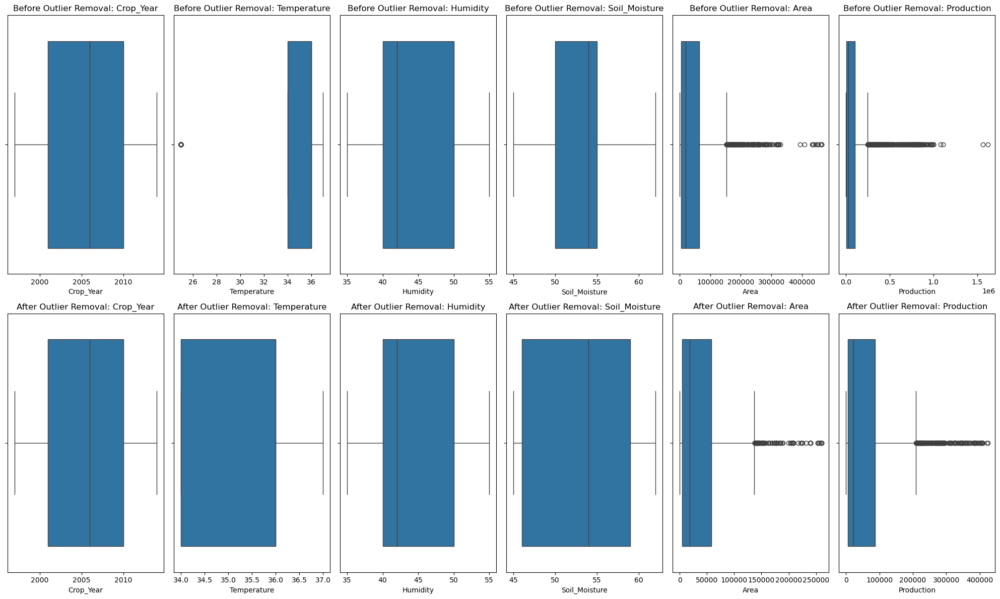

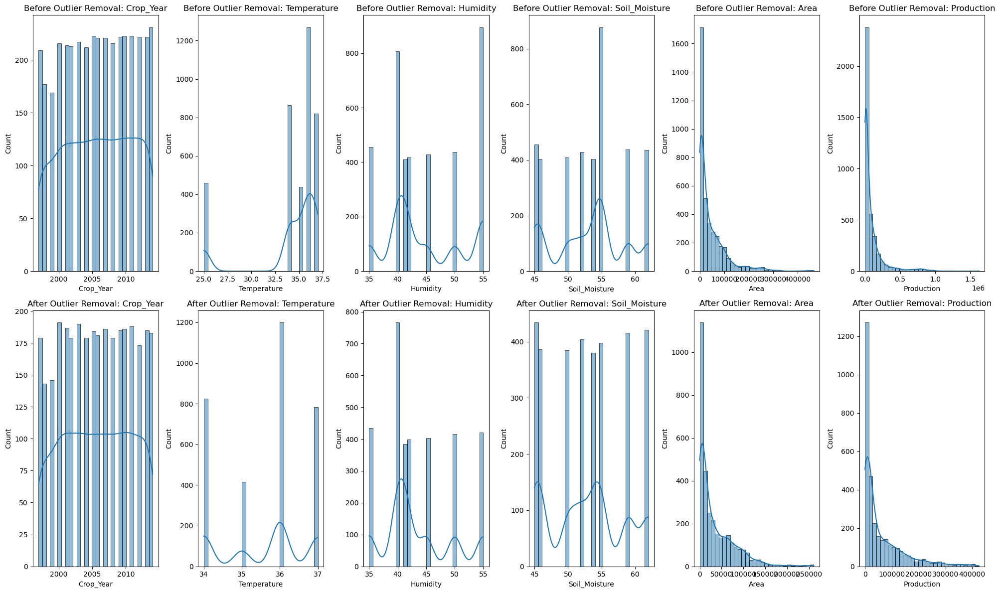

In [57]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define features for visualization
# features = ['Crop_Year', 'Temperature', 'Humidity', 'Soil_Moisture', 'Area', 'Production', 'Yield']
features = ['Crop_Year', 'Temperature', 'Humidity', 'Soil_Moisture', 'Area', 'Production']
# Set up figure size
plt.figure(figsize=(20, 12))

# Boxplots Before & After Outlier Removal
for i, col in enumerate(features):
    plt.subplot(2, len(features), i+1)  # First row (Before Outlier Removal)
    sns.boxplot(x=rice_dataframe_withoutCrop[col])
    plt.title(f"Before Outlier Removal: {col}")

    plt.subplot(2, len(features), i+1+len(features))  # Second row (After Outlier Removal)
    sns.boxplot(x=df_cleaned[col])
    plt.title(f"After Outlier Removal: {col}")

plt.tight_layout()
plt.show()

# Histograms Before & After
plt.figure(figsize=(20, 12))
for i, col in enumerate(features):
    plt.subplot(2, len(features), i+1)  # First row (Before)
    sns.histplot(rice_dataframe_withoutCrop[col], kde=True, bins=30)
    plt.title(f"Before Outlier Removal: {col}")

    plt.subplot(2, len(features), i+1+len(features))  # Second row (After)
    sns.histplot(df_cleaned[col], kde=True, bins=30)
    plt.title(f"After Outlier Removal: {col}")

plt.tight_layout()
plt.show()




# ===========================================================================================================
# import seaborn as sns
# import matplotlib.pyplot as plt

# features = ['Temperature', 'Area', 'Production', 'Yield']

# plt.figure(figsize=(12, 6))
# for i, col in enumerate(features):
#     plt.subplot(2, 2, i+1)
#     sns.boxplot(x=df_cleaned[col])
#     plt.title(f'Box Plot of {col}')
# plt.show()



## Visualizing Temperature

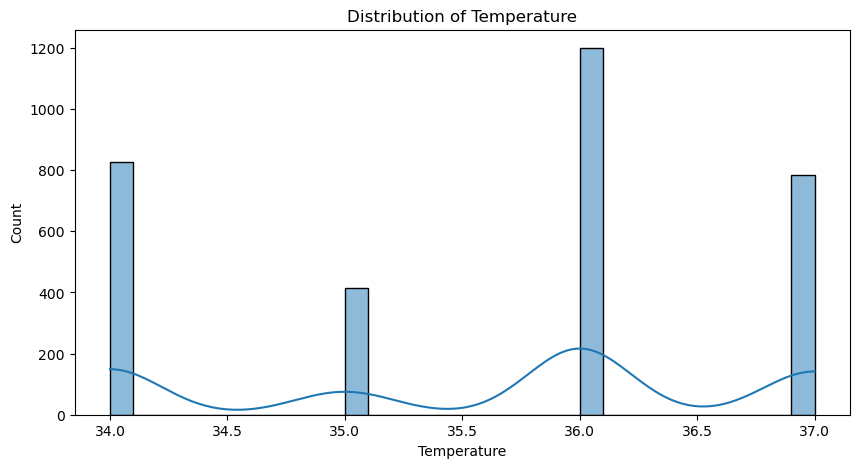

In [59]:
# plt.subplots(figsize=(10,5)) 
# sns.distplot(df_cleaned['Temperature']) 


plt.figure(figsize=(10, 5))
sns.histplot(df_cleaned['Temperature'], bins=30, kde=True)  # kde=True adds a density curve
plt.title("Distribution of Temperature")
plt.show()

## Visualizing Area

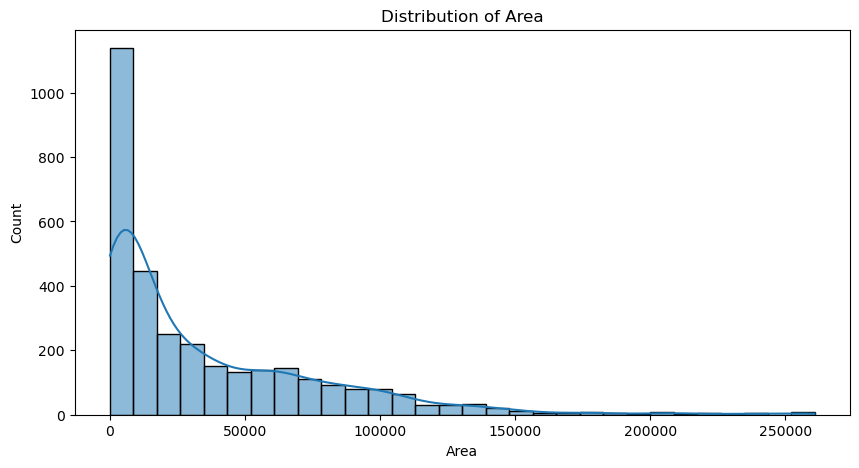

In [61]:
# plt.subplots(figsize=(10,5)) 
# sns.distplot(df_cleaned['Area']) 




import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
sns.histplot(df_cleaned['Area'], bins=30, kde=True)  # kde=True adds a density curve
plt.title("Distribution of Area")
plt.show()


# sns.displot(df_cleaned['Area'], bins=30, kde=True, height=5, aspect=2)
# plt.title("Distribution of Area")
# plt.show()



## Visualizing Production

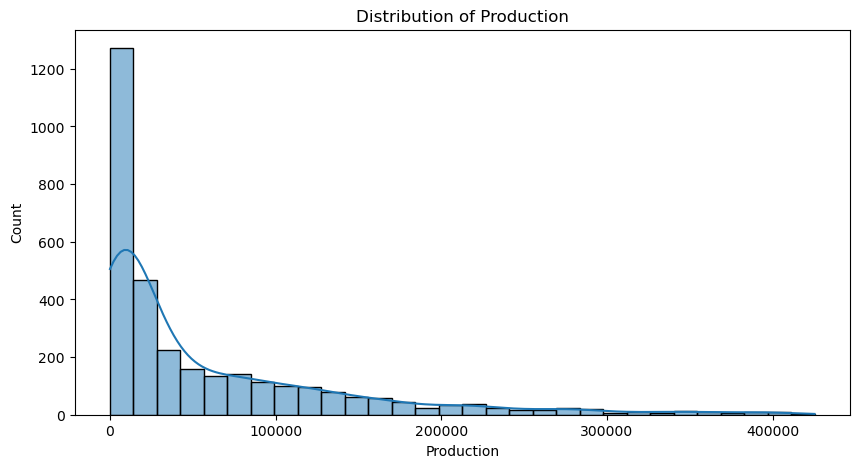

In [63]:

plt.figure(figsize=(10, 5))
sns.histplot(df_cleaned['Production'], bins=30, kde=True)  # kde=True adds a density curve
plt.title("Distribution of Production")
plt.show()

In [835]:
## Visualizing Yield

In [833]:

# plt.figure(figsize=(10, 5))
# sns.histplot(df_cleaned['Yield'], bins=30, kde=True)  # kde=True adds a density curve
# plt.title("Distribution of Yield")
# plt.show()

###  AREA AND PRODUCTION STILL HAVE LEFT SKEWED  
##### (yld,) 

In [65]:
# # df_cleaned['Area'] = np.log1p(df_cleaned['Area'])  # log(1 + x) to handle zeros
# # df_cleaned['Production'] = np.log1p(df_cleaned['Production'])


# df_cleaned.loc[:, 'Area'] = np.log1p(df_cleaned['Area'])  
# df_cleaned.loc[:, 'Production'] = np.log1p(df_cleaned['Production'])  



# # df_cleaned = df_cleaned.copy()
# # df_cleaned['Area'] = np.log1p(df_cleaned['Area'])  
# # df_cleaned['Production'] = np.log1p(df_cleaned['Production'])  
# ========================================================================================this wroks when we have right skewwed data!!!!


# # HANDLING LEFT SKWED DATA
# df_cleaned['Area'] = df_cleaned['Area'] ** 3
# df_cleaned['Production'] = df_cleaned['Production'] ** 3
# # df_cleaned['Yield'] = df_cleaned['Yield'] ** 2

# df_cleaned['Area'] = np.exp(df_cleaned['Area'])
# df_cleaned['Production'] = np.exp(df_cleaned['Production'])


# df_cleaned['Area'] = 1 / (df_cleaned['Area'] + 1)  # Adding 1 to avoid division by zero
# df_cleaned['Production'] = 1 / (df_cleaned['Production'] + 1)
# # df_cleaned['Yield'] = 1 / (df_cleaned['Yield'] + 1)
# ========================================================================================





# ========================================================================================
# 1)Apply Yeo-Johnson Transformation , left-skewed data ko handle krna h !!!
# ========================================================================================
from sklearn.preprocessing import PowerTransformer 

# Power Transformations 

pt = PowerTransformer(method='yeo-johnson')  # Handles both positive & negative data

# Apply transformation on skewed features
# df_cleaned[['Area', 'Production', 'Yield']] = pt.fit_transform(df_cleaned[['Area', 'Production', 'Yield']])

df_cleaned[['Area', 'Production']] = pt.fit_transform(df_cleaned[['Area', 'Production']])



### Verify Skewness After Transformation

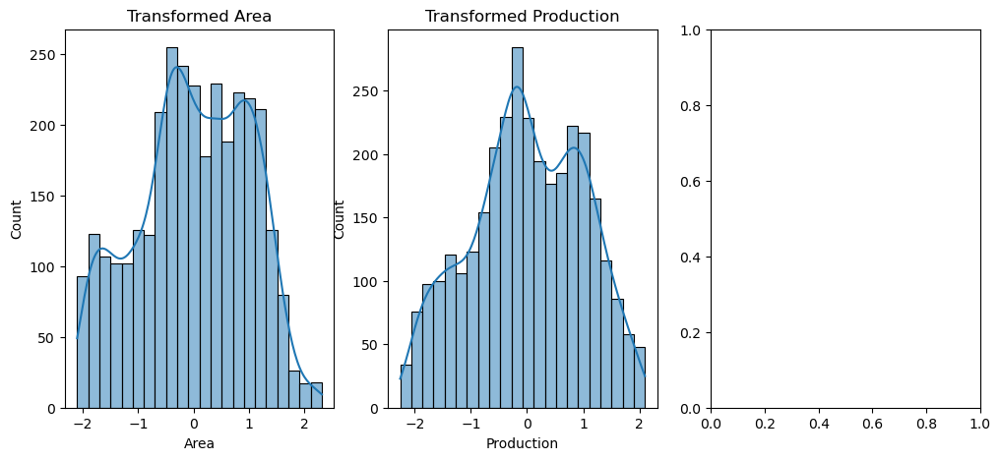

In [67]:
# # plt.figure(figsize=(12, 6))

# # plt.subplot(1, 2, 1)
# # sns.histplot(df_cleaned['Area'], kde=True, bins=30)
# # plt.title("Transformed Area Distribution")

# # plt.subplot(1, 2, 2)
# # sns.histplot(df_cleaned['Production'], kde=True, bins=30)
# # plt.title("Transformed Production Distribution")

# # plt.show()




# import seaborn as sns
# import matplotlib.pyplot as plt

# features = ['Area', 'Production', 'Yield']

# plt.figure(figsize=(12, 6))
# for i, col in enumerate(features):
#     plt.subplot(1, 3, i+1)
#     sns.histplot(df_cleaned[col], kde=True, bins=30)
#     plt.title(f'Distribution of {col}')
# plt.show()

# ========================================================================================





# ========================================================================================
import seaborn as sns
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(12, 5))

sns.histplot(df_cleaned['Area'], kde=True, ax=axes[0])
axes[0].set_title("Transformed Area")

sns.histplot(df_cleaned['Production'], kde=True, ax=axes[1])
axes[1].set_title("Transformed Production")

# sns.histplot(df_cleaned['Yield'], kde=True, ax=axes[2])
# axes[2].set_title("Transformed Yield")

plt.show()


## FINAL VISUALIZATION AFTER OUTLIERS - REMOVAL !!!!

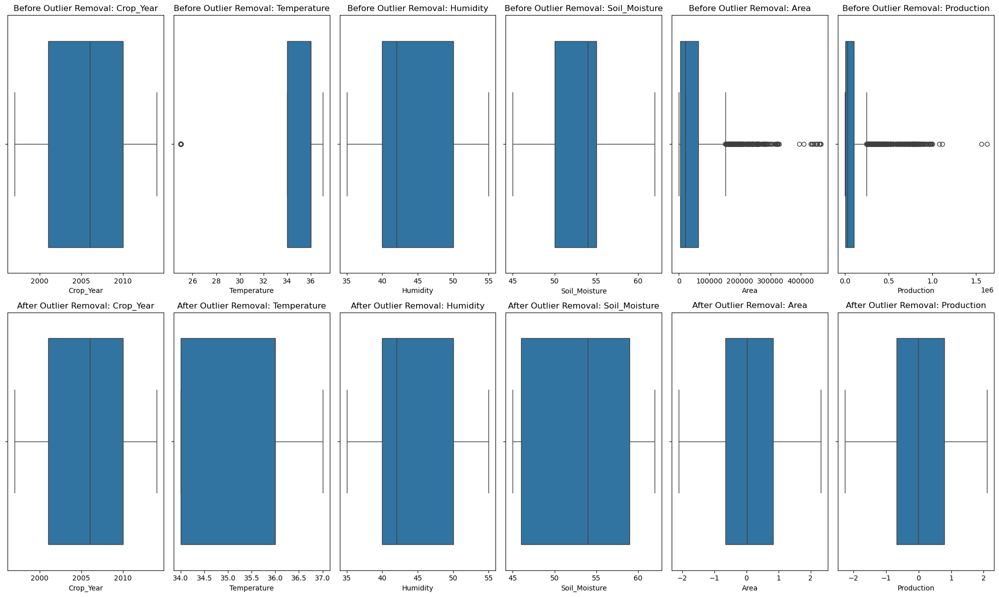

In [69]:
# features = ['Crop_Year', 'Temperature', 'Humidity', 'Soil_Moisture', 'Area', 'Production', 'Yield']
features = ['Crop_Year', 'Temperature', 'Humidity', 'Soil_Moisture', 'Area', 'Production']


# Set up figure size
plt.figure(figsize=(20, 12))

# Boxplots Before & After Outlier Removal
for i, col in enumerate(features):
    plt.subplot(2, len(features), i+1)  # First row (Before Outlier Removal)
    sns.boxplot(x=rice_dataframe_withoutCrop[col])
    plt.title(f"Before Outlier Removal: {col}")

    plt.subplot(2, len(features), i+1+len(features))  # Second row (After Outlier Removal)
    sns.boxplot(x=df_cleaned[col])
    plt.title(f"After Outlier Removal: {col}")

plt.tight_layout()
plt.show()




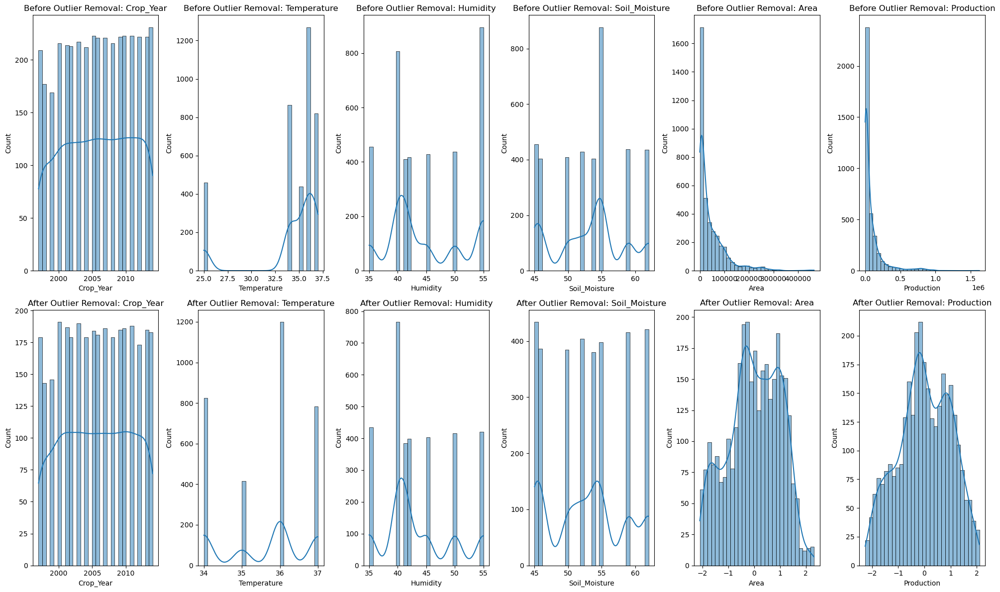

In [71]:



# Histograms Before & After
plt.figure(figsize=(20, 12))
for i, col in enumerate(features):
    plt.subplot(2, len(features), i+1)  # First row (Before)
    sns.histplot(rice_dataframe_withoutCrop[col], kde=True, bins=30)
    plt.title(f"Before Outlier Removal: {col}")

    plt.subplot(2, len(features), i+1+len(features))  # Second row (After)
    sns.histplot(df_cleaned[col], kde=True, bins=30)
    plt.title(f"After Outlier Removal: {col}")

plt.tight_layout()
plt.show()

In [73]:
df_cleaned

,State_Name,District_Name,Crop_Year,Season,Temperature,Humidity,Soil_Moisture,Area,Production
2,Andaman and Nicobar Islands,NICOBARS,2000,Kharif,36,41,50,-1.699925,-1.516367
12,Andaman and Nicobar Islands,NICOBARS,2001,Kharif,37,42,55,-1.731926,-1.531104
18,Andaman and Nicobar Islands,NICOBARS,2002,Kharif,36,35,45,-1.593021,-1.409377
27,Andaman and Nicobar Islands,NICOBARS,2003,Kharif,36,35,45,-1.798367,-1.760954
36,Andaman and Nicobar Islands,NICOBARS,2004,Kharif,36,35,45,-1.795971,-1.796584
...,...,...,...,...,...,...,...,...,...
49449,Chhattisgarh,GARIYABAND,2012,Kharif,34,45,52,1.577888,1.452397
49484,Chhattisgarh,GARIYABAND,2013,Kharif,34,45,52,1.595966,1.421327
49594,Chhattisgarh,JANJGIR-CHAMPA,2001,Kharif,36,35,45,2.292582,2.008708
49666,Chhattisgarh,JANJGIR-CHAMPA,2003,Kharif,36,35,45,2.284233,1.894164


In [75]:
# df_cleaned[['Area', 'Production', 'Yield']].describe()
df_cleaned[['Area', 'Production']].describe()


,Area,Production
count,3.224000e+03,3.224000e+03
mean,-6.038732e-16,1.851290e-16
std,1.000155e+00,1.000155e+00
min,-2.100579e+00,-2.260474e+00
25%,-6.557079e-01,-6.766710e-01
50%,2.799893e-02,-1.675813e-02
75%,8.359388e-01,7.957475e-01
max,2.319348e+00,2.099560e+00


### Normalize the Remaining Features

##### Since,

1)Temperature  

2) Humidity 

3) Soil_Moisture  
4) Crop_Year 

do not have extreme skewness, i'm using StandardScaler to bring them to a similar scale.

In [77]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

# Apply scaling on remaining numerical columns
df_cleaned[['Crop_Year', 'Temperature', 'Humidity', 'Soil_Moisture']] = scaler.fit_transform(
    df_cleaned[['Crop_Year', 'Temperature', 'Humidity', 'Soil_Moisture']]
)

df_cleaned  # Check the transformed data


,State_Name,District_Name,Crop_Year,Season,Temperature,Humidity,Soil_Moisture,Area,Production
2,Andaman and Nicobar Islands,NICOBARS,-1.103676,Kharif,0.357431,-0.424277,-0.519416,-1.699925,-1.516367
12,Andaman and Nicobar Islands,NICOBARS,-0.908575,Kharif,1.256305,-0.259115,0.371327,-1.731926,-1.531104
18,Andaman and Nicobar Islands,NICOBARS,-0.713474,Kharif,0.357431,-1.415248,-1.410160,-1.593021,-1.409377
27,Andaman and Nicobar Islands,NICOBARS,-0.518373,Kharif,0.357431,-1.415248,-1.410160,-1.798367,-1.760954
36,Andaman and Nicobar Islands,NICOBARS,-0.323272,Kharif,0.357431,-1.415248,-1.410160,-1.795971,-1.796584
...,...,...,...,...,...,...,...,...,...
49449,Chhattisgarh,GARIYABAND,1.237536,Kharif,-1.440318,0.236370,-0.163119,1.577888,1.452397
49484,Chhattisgarh,GARIYABAND,1.432637,Kharif,-1.440318,0.236370,-0.163119,1.595966,1.421327
49594,Chhattisgarh,JANJGIR-CHAMPA,-0.908575,Kharif,0.357431,-1.415248,-1.410160,2.292582,2.008708
49666,Chhattisgarh,JANJGIR-CHAMPA,-0.518373,Kharif,0.357431,-1.415248,-1.410160,2.284233,1.894164


In [79]:
df_cleaned.describe()

,Crop_Year,Temperature,Humidity,Soil_Moisture,Area,Production
count,3.224000e+03,3.224000e+03,3.224000e+03,3.224000e+03,3.224000e+03,3.224000e+03
mean,5.586929e-16,-2.760406e-15,-6.071790e-16,-1.377448e-16,-6.038732e-16,1.851290e-16
std,1.000155e+00,1.000155e+00,1.000155e+00,1.000155e+00,1.000155e+00,1.000155e+00
min,-1.688979e+00,-1.440318e+00,-1.415248e+00,-1.410160e+00,-2.100579e+00,-2.260474e+00
25%,-9.085751e-01,-1.440318e+00,-5.894390e-01,-1.232011e+00,-6.557079e-01,-6.766710e-01
50%,6.692980e-02,3.574308e-01,-2.591154e-01,1.931786e-01,2.799893e-02,-1.675813e-02
75%,8.473337e-01,3.574308e-01,1.062179e+00,1.083922e+00,8.359388e-01,7.957475e-01
max,1.627738e+00,1.256305e+00,1.887987e+00,1.618368e+00,2.319348e+00,2.099560e+00


# Handle Categorical Data (Encoding)

##### Use One-Hot Encoding for Season (since it has few unique values like "Kharif", "Rabi", etc.)

##### Use Label Encoding for State_Name & District_Name (if they have too many unique values)

##### State_Name → 7 unique values → One-Hot Encoding 

##### District_Name → 111 unique values → Label Encoding (since it's too many for One-Hot Encoding)

##### Season → 6 unique values → One-Hot Encoding

In [81]:
# print("Total number of States present in dataset are :", df_rice["State"].count())

# Count unique crop types
unique_states = df_rice["State_Name"].unique()
print("\n===============================================\n")
print("1 - (a) Total unique States :", unique_states)


state_counts = df_rice["State_Name"].value_counts()
print("\n1 - (b)State-wise count: \n", state_counts)

unique_states_count = df_rice["State_Name"].nunique()

print("\n1 - (c) Total unique States :-----------------------------------------------> ", unique_states_count)




unique_districts = df_rice["District_Name"].unique()
print("\n===============================================\n")
print("2 - (a) Total unique Districts :", unique_districts)

# Show count of each crop
district_counts = df_rice["District_Name"].value_counts()
print("\n2 - (b) District-wise count: \n", district_counts)

unique_district_count = df_rice["District_Name"].nunique()
print("\n2 - (c) Total unique Districts :-----------------------------------------------> ", unique_district_count)




unique_seasons = df_rice["Season"].unique()
print("\n===============================================\n")
print("3 - (a) Total unique Seasons :", unique_seasons)

# Show count of each crop
season_counts = df_rice["Season"].value_counts()
print("\n3 - (b) Season-wise count: \n", season_counts)

unique_season_count = df_rice["Season"].nunique()
print("\n3 - (c) Total unique Seasons :-----------------------------------------------> ", unique_season_count)




unique_temperatures = df_rice["Temperature"].unique()
print("\n===============================================\n")
print("4 - (a) Total unique Temparatures :", unique_temperatures)

# Show count of each crop
temperature_counts = df_rice["Temperature"].value_counts()
print("\n4 - (b) Temparature-wise count: \n", temperature_counts)

unique_temp_count = df_rice["Temperature"].nunique()
print("\n4 - (c) Total unique Temparatures :----------------------------------------------->", unique_temp_count)




1 - (a) Total unique States : ['Andaman and Nicobar Islands' 'Andhra Pradesh' 'Arunachal Pradesh'
 'Assam' 'Bihar' 'Chandigarh' 'Chhattisgarh']

1 - (b)State-wise count: 
 State_Name
Bihar                          1601
Assam                          1356
Andhra Pradesh                  481
Arunachal Pradesh               273
Chhattisgarh                    110
Andaman and Nicobar Islands      17
Chandigarh                       13
Name: count, dtype: int64

1 - (c) Total unique States :----------------------------------------------->  7


2 - (a) Total unique Districts : ['NICOBARS' 'NORTH AND MIDDLE ANDAMAN' 'SOUTH ANDAMANS' 'ANANTAPUR'
 'CHITTOOR' 'EAST GODAVARI' 'GUNTUR' 'KADAPA' 'KRISHNA' 'KURNOOL'
 'PRAKASAM' 'SPSR NELLORE' 'SRIKAKULAM' 'VISAKHAPATANAM' 'VIZIANAGARAM'
 'WEST GODAVARI' 'ANJAW' 'CHANGLANG' 'DIBANG VALLEY' 'EAST KAMENG'
 'EAST SIANG' 'KURUNG KUMEY' 'LOHIT' 'LONGDING' 'LOWER DIBANG VALLEY'
 'LOWER SUBANSIRI' 'PAPUM PARE' 'TAWANG' 'TIRAP' 'UPPER SIANG'
 'UPPER SUBANS

In [83]:
df_cleaned.head(50)

,State_Name,District_Name,Crop_Year,Season,Temperature,Humidity,Soil_Moisture,Area,Production
2,Andaman and Nicobar Islands,NICOBARS,-1.103676,Kharif,0.357431,-0.424277,-0.519416,-1.699925,-1.516367
12,Andaman and Nicobar Islands,NICOBARS,-0.908575,Kharif,1.256305,-0.259115,0.371327,-1.731926,-1.531104
18,Andaman and Nicobar Islands,NICOBARS,-0.713474,Kharif,0.357431,-1.415248,-1.410160,-1.593021,-1.409377
27,Andaman and Nicobar Islands,NICOBARS,-0.518373,Kharif,0.357431,-1.415248,-1.410160,-1.798367,-1.760954
36,Andaman and Nicobar Islands,NICOBARS,-0.323272,Kharif,0.357431,-1.415248,-1.410160,-1.795971,-1.796584
45,Andaman and Nicobar Islands,NICOBARS,-0.128171,Kharif,0.357431,-1.415248,-1.410160,-2.073421,-2.033017
62,Andaman and Nicobar Islands,NICOBARS,0.847334,Autumn,1.256305,-0.589439,-1.232011,-2.047405,-2.052232
79,Andaman and Nicobar Islands,NORTH AND MIDDLE ANDAMAN,-1.103676,Kharif,0.357431,-1.415248,-1.410160,-0.265553,0.165026
90,Andaman and Nicobar Islands,NORTH AND MIDDLE ANDAMAN,-0.908575,Kharif,0.357431,-0.424277,-0.519416,-0.319364,0.073640
109,Andaman and Nicobar Islands,NORTH AND MIDDLE ANDAMAN,0.847334,Autumn,1.256305,-0.259115,0.371327,-0.494896,-0.083042


In [85]:
df_encoded_cleaned = df_cleaned.copy()

In [87]:
df_encoded_cleaned.head(50)

,State_Name,District_Name,Crop_Year,Season,Temperature,Humidity,Soil_Moisture,Area,Production
2,Andaman and Nicobar Islands,NICOBARS,-1.103676,Kharif,0.357431,-0.424277,-0.519416,-1.699925,-1.516367
12,Andaman and Nicobar Islands,NICOBARS,-0.908575,Kharif,1.256305,-0.259115,0.371327,-1.731926,-1.531104
18,Andaman and Nicobar Islands,NICOBARS,-0.713474,Kharif,0.357431,-1.415248,-1.410160,-1.593021,-1.409377
27,Andaman and Nicobar Islands,NICOBARS,-0.518373,Kharif,0.357431,-1.415248,-1.410160,-1.798367,-1.760954
36,Andaman and Nicobar Islands,NICOBARS,-0.323272,Kharif,0.357431,-1.415248,-1.410160,-1.795971,-1.796584
45,Andaman and Nicobar Islands,NICOBARS,-0.128171,Kharif,0.357431,-1.415248,-1.410160,-2.073421,-2.033017
62,Andaman and Nicobar Islands,NICOBARS,0.847334,Autumn,1.256305,-0.589439,-1.232011,-2.047405,-2.052232
79,Andaman and Nicobar Islands,NORTH AND MIDDLE ANDAMAN,-1.103676,Kharif,0.357431,-1.415248,-1.410160,-0.265553,0.165026
90,Andaman and Nicobar Islands,NORTH AND MIDDLE ANDAMAN,-0.908575,Kharif,0.357431,-0.424277,-0.519416,-0.319364,0.073640
109,Andaman and Nicobar Islands,NORTH AND MIDDLE ANDAMAN,0.847334,Autumn,1.256305,-0.259115,0.371327,-0.494896,-0.083042


In [89]:
print(df_encoded_cleaned['State_Name'].unique())  

print(df_encoded_cleaned['District_Name'].unique()) 

print(df_encoded_cleaned['Season'].unique())  


['Andaman and Nicobar Islands' 'Andhra Pradesh' 'Arunachal Pradesh'
 'Assam' 'Bihar' 'Chandigarh' 'Chhattisgarh']
['NICOBARS' 'NORTH AND MIDDLE ANDAMAN' 'SOUTH ANDAMANS' 'ANANTAPUR'
 'CHITTOOR' 'EAST GODAVARI' 'GUNTUR' 'KADAPA' 'KRISHNA' 'KURNOOL'
 'PRAKASAM' 'SPSR NELLORE' 'SRIKAKULAM' 'VISAKHAPATANAM' 'VIZIANAGARAM'
 'ANJAW' 'CHANGLANG' 'DIBANG VALLEY' 'EAST KAMENG' 'EAST SIANG'
 'KURUNG KUMEY' 'LOHIT' 'LONGDING' 'LOWER DIBANG VALLEY' 'LOWER SUBANSIRI'
 'PAPUM PARE' 'TAWANG' 'TIRAP' 'UPPER SIANG' 'UPPER SUBANSIRI'
 'WEST KAMENG' 'WEST SIANG' 'BAKSA' 'BARPETA' 'BONGAIGAON' 'CACHAR'
 'CHIRANG' 'DARRANG' 'DHEMAJI' 'DHUBRI' 'DIBRUGARH' 'DIMA HASAO'
 'GOALPARA' 'GOLAGHAT' 'HAILAKANDI' 'JORHAT' 'KAMRUP' 'KAMRUP METRO'
 'KARBI ANGLONG' 'KARIMGANJ' 'KOKRAJHAR' 'LAKHIMPUR' 'MARIGAON' 'NAGAON'
 'NALBARI' 'SIVASAGAR' 'SONITPUR' 'TINSUKIA' 'UDALGURI' 'ARARIA' 'ARWAL'
 'AURANGABAD' 'BANKA' 'BEGUSARAI' 'BHAGALPUR' 'BHOJPUR' 'BUXAR'
 'DARBHANGA' 'GAYA' 'GOPALGANJ' 'JAMUI' 'JEHANABAD' 'KAIMUR (BHABU

In [589]:
# print(encoded_df.columns)  # Should include 'State_Name_Andaman Nicobar Islands' & 'Season_Autumn'


In [91]:
from sklearn.preprocessing import OneHotEncoder, LabelEncoder


# df_encoded_cleaned

one_hot_encoding_on_state_and_season = ['State_Name','Season']
label_encoding_on_district = ['District_Name']


# ohe = OneHotEncoder(sparse_output=False, handle_unknown='ignore')  # drop='first', :----> isne mere andaman + autumn colum
# Ensure all categories are considered
ohe = OneHotEncoder(sparse_output=False, handle_unknown='ignore', categories=[
    df_encoded_cleaned['State_Name'].unique(), 
    df_encoded_cleaned['Season'].unique()
])



encoded_array = ohe.fit_transform(df_encoded_cleaned[one_hot_encoding_on_state_and_season])
encoded_df = pd.DataFrame(encoded_array, columns=ohe.get_feature_names_out(one_hot_encoding_on_state_and_season))


# Apply LabelEncoder to 'District_Name'
le = LabelEncoder()
df_encoded_cleaned['District_Name'] = le.fit_transform(df_encoded_cleaned['District_Name'])



 # Drop original categorical columns & concatenate encoded features
df_encoded_cleaned = df_encoded_cleaned.drop(columns=one_hot_encoding_on_state_and_season).reset_index(drop=True)
df_encoded_cleaned = pd.concat([df_encoded_cleaned, encoded_df], axis=1)

print("Final Columns in Encoded DataFrame:")
print(df_encoded_cleaned.columns)
# df_encoded_cleaned

Final Columns in Encoded DataFrame:
Index(['District_Name', 'Crop_Year', 'Temperature', 'Humidity',
       'Soil_Moisture', 'Area', 'Production',
       'State_Name_Andaman and Nicobar Islands', 'State_Name_Andhra Pradesh',
       'State_Name_Arunachal Pradesh', 'State_Name_Assam', 'State_Name_Bihar',
       'State_Name_Chandigarh', 'State_Name_Chhattisgarh',
       'Season_Kharif     ', 'Season_Autumn     ', 'Season_Rabi       ',
       'Season_Whole Year ', 'Season_Summer     ', 'Season_Winter     '],
      dtype='object')


In [93]:
df_encoded_cleaned.tail(20)

,District_Name,Crop_Year,Temperature,Humidity,Soil_Moisture,Area,Production,State_Name_Andaman and Nicobar Islands,State_Name_Andhra Pradesh,State_Name_Arunachal Pradesh,State_Name_Assam,State_Name_Bihar,State_Name_Chandigarh,State_Name_Chhattisgarh,Season_Kharif,Season_Autumn,Season_Rabi,Season_Whole Year,Season_Summer,Season_Winter
3204,27,-1.103676,-1.440318,0.236370,-0.163119,1.662485,1.138492,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
3205,27,-0.908575,-1.440318,0.236370,-0.163119,1.656394,1.482229,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
3206,27,-0.713474,-1.440318,0.236370,-0.163119,1.631206,1.269572,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
3207,27,-0.323272,1.256305,-0.259115,0.371327,1.677238,1.433098,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
3208,27,-0.128171,1.256305,-0.259115,0.371327,1.706628,1.688402,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
3209,27,0.066930,-1.440318,1.887987,1.618368,1.798400,1.856014,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
3210,27,0.262031,0.357431,-1.415248,-1.410160,1.869965,1.905142,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
3211,27,0.457132,0.357431,-0.424277,-0.519416,1.724772,1.675991,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
3212,27,0.652233,1.256305,-0.259115,0.371327,1.665735,1.651107,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
3213,27,0.847334,-1.440318,0.236370,-0.163119,1.831856,2.029119,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0


# DATA NORMALIZATION

In [95]:
# Apply StandardScaler

# from sklearn.preprocessing import StandardScaler

# # Select numerical features for scaling (excluding categorical ones)
# numerical_features = ['District_Name', 'Crop_Year', 'Temperature', 'Humidity', 
#                       'Soil_Moisture', 'Area', 'Production', 'Yield']

# # Initialize StandardScaler
# scaler = StandardScaler()

# # Fit and transform the numerical columns
# df_cleaned[numerical_features] = scaler.fit_transform(df_cleaned[numerical_features])

# # Check the results
# print(df_cleaned.head())






from sklearn.preprocessing import StandardScaler

# Initialize StandardScaler
scaler = StandardScaler()

# Fit and transform the entire dataset
FINAL_SCALED_DATAFRAME_AFTER_ALL_STEPS = pd.DataFrame(scaler.fit_transform(df_encoded_cleaned), columns=df_encoded_cleaned.columns)

# Check the scaled dataset
FINAL_SCALED_DATAFRAME_AFTER_ALL_STEPS





,District_Name,Crop_Year,Temperature,Humidity,Soil_Moisture,Area,Production,State_Name_Andaman and Nicobar Islands,State_Name_Andhra Pradesh,State_Name_Arunachal Pradesh,State_Name_Assam,State_Name_Bihar,State_Name_Chandigarh,State_Name_Chhattisgarh,Season_Kharif,Season_Autumn,Season_Rabi,Season_Whole Year,Season_Summer,Season_Winter
0,0.661852,-1.103676,0.357431,-0.424277,-0.519416,-1.699925,-1.516367,14.159802,-0.322074,-0.277813,-0.767437,-0.876096,-0.058511,-0.146786,2.19773,-0.592634,-0.225494,-0.039412,-0.57162,-0.611763
1,0.661852,-0.908575,1.256305,-0.259115,0.371327,-1.731926,-1.531104,14.159802,-0.322074,-0.277813,-0.767437,-0.876096,-0.058511,-0.146786,2.19773,-0.592634,-0.225494,-0.039412,-0.57162,-0.611763
2,0.661852,-0.713474,0.357431,-1.415248,-1.410160,-1.593021,-1.409377,14.159802,-0.322074,-0.277813,-0.767437,-0.876096,-0.058511,-0.146786,2.19773,-0.592634,-0.225494,-0.039412,-0.57162,-0.611763
3,0.661852,-0.518373,0.357431,-1.415248,-1.410160,-1.798367,-1.760954,14.159802,-0.322074,-0.277813,-0.767437,-0.876096,-0.058511,-0.146786,2.19773,-0.592634,-0.225494,-0.039412,-0.57162,-0.611763
4,0.661852,-0.323272,0.357431,-1.415248,-1.410160,-1.795971,-1.796584,14.159802,-0.322074,-0.277813,-0.767437,-0.876096,-0.058511,-0.146786,2.19773,-0.592634,-0.225494,-0.039412,-0.57162,-0.611763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3219,-0.639659,1.237536,-1.440318,0.236370,-0.163119,1.577888,1.452397,-0.070622,-0.322074,-0.277813,-0.767437,-0.876096,-0.058511,6.812618,2.19773,-0.592634,-0.225494,-0.039412,-0.57162,-0.611763
3220,-0.639659,1.432637,-1.440318,0.236370,-0.163119,1.595966,1.421327,-0.070622,-0.322074,-0.277813,-0.767437,-0.876096,-0.058511,6.812618,2.19773,-0.592634,-0.225494,-0.039412,-0.57162,-0.611763
3221,-0.372682,-0.908575,0.357431,-1.415248,-1.410160,2.292582,2.008708,-0.070622,-0.322074,-0.277813,-0.767437,-0.876096,-0.058511,6.812618,2.19773,-0.592634,-0.225494,-0.039412,-0.57162,-0.611763
3222,-0.372682,-0.518373,0.357431,-1.415248,-1.410160,2.284233,1.894164,-0.070622,-0.322074,-0.277813,-0.767437,-0.876096,-0.058511,6.812618,2.19773,-0.592634,-0.225494,-0.039412,-0.57162,-0.611763


In [875]:
# print(FINAL_SCALED_DATAFRAME_AFTER_ALL_STEPS.dtypes)


# print(FINAL_SCALED_DATAFRAME_AFTER_ALL_STEPS.isna().sum())


print(FINAL_SCALED_DATAFRAME_AFTER_ALL_STEPS.describe())


       District_Name     Crop_Year   Temperature      Humidity  Soil_Moisture  \
count   3.224000e+03  3.224000e+03  3.224000e+03  3.224000e+03   3.224000e+03   
mean    8.815667e-17 -3.526267e-17 -2.534504e-17  1.432546e-17   8.374883e-17   
std     1.000155e+00  1.000155e+00  1.000155e+00  1.000155e+00   1.000155e+00   
min    -1.874426e+00 -1.688979e+00 -1.440318e+00 -1.415248e+00  -1.410160e+00   
25%    -8.732635e-01 -9.085751e-01 -1.440318e+00 -5.894390e-01  -1.232011e+00   
50%    -5.589615e-03  6.692980e-02  3.574308e-01 -2.591154e-01   1.931786e-01   
75%     8.954563e-01  8.473337e-01  3.574308e-01  1.062179e+00   1.083922e+00   
max     1.729758e+00  1.627738e+00  1.256305e+00  1.887987e+00   1.618368e+00   

               Area    Production  State_Name_Andaman and Nicobar Islands  \
count  3.224000e+03  3.224000e+03                            3.224000e+03   
mean   1.763133e-17 -8.815667e-18                            1.322350e-17   
std    1.000155e+00  1.000155e+00      

# FEATURE SELECTION PROCESS

## CHECKING CORRELATIONS

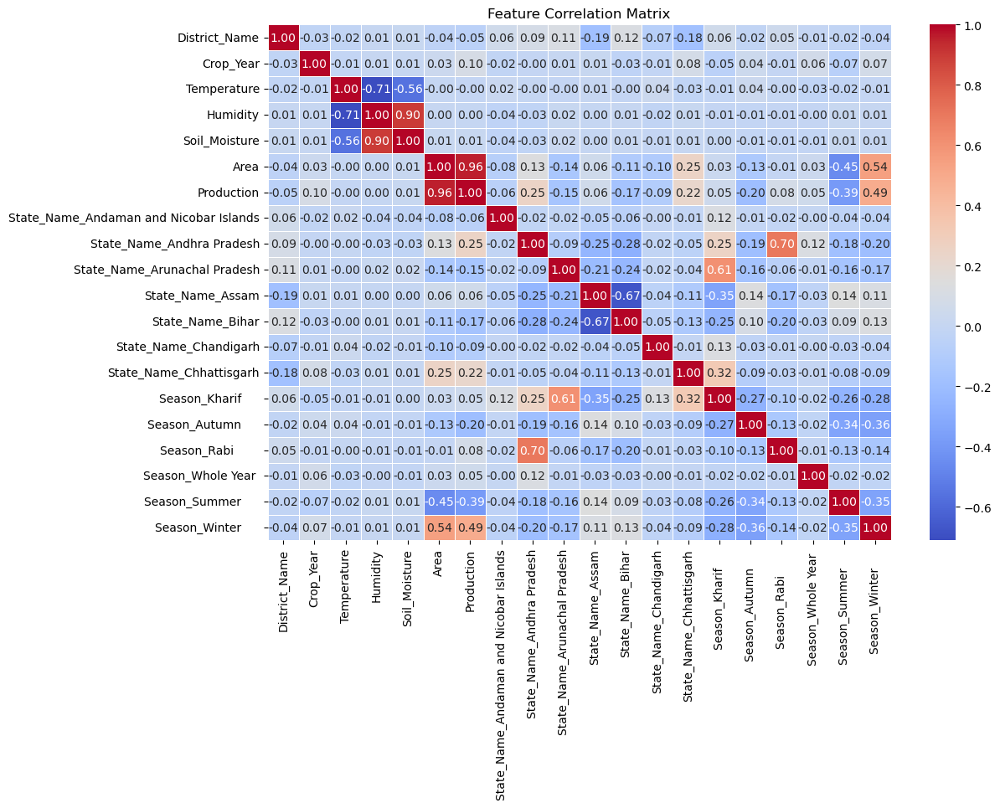

In [97]:
import seaborn as sns
import matplotlib.pyplot as plt

# Compute correlation matrix
correlation_matrix = FINAL_SCALED_DATAFRAME_AFTER_ALL_STEPS.corr()

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f",linewidths=0.5)
plt.title("Feature Correlation Matrix")
plt.show()


## Get correlations of all features with Yield

In [101]:
# Get correlations of all features with Yield
correlation_with_target = FINAL_SCALED_DATAFRAME_AFTER_ALL_STEPS.corr()['Yield'].sort_values(ascending=False)

# Print the top correlations
print(correlation_with_target)


KeyError: 'Yield'

 ## Extract Top Positive & Negative Correlations

In [103]:
# Convert correlation matrix to a long format
corr_unstacked = FINAL_SCALED_DATAFRAME_AFTER_ALL_STEPS.corr().unstack().reset_index()
corr_unstacked.columns = ['Feature_1', 'Feature_2', 'Correlation']

# Remove self-correlations (correlation of a feature with itself)
corr_unstacked = corr_unstacked[corr_unstacked['Feature_1'] != corr_unstacked['Feature_2']]

# Get top highly correlated positive features
top_positive_corr = corr_unstacked.sort_values(by='Correlation', ascending=False).head(10)

# Get top highly correlated negative features
top_negative_corr = corr_unstacked.sort_values(by='Correlation', ascending=True).head(10)

print(" Highly Positively Correlated Features:\n", top_positive_corr)
print("\n\n Highly Negatively Correlated Features:\n", top_negative_corr)


 Highly Positively Correlated Features:
                         Feature_1                     Feature_2  Correlation
106                          Area                    Production     0.956267
125                    Production                          Area     0.956267
83                  Soil_Moisture                      Humidity     0.899335
64                       Humidity                 Soil_Moisture     0.899335
328            Season_Rabi            State_Name_Andhra Pradesh     0.700131
176     State_Name_Andhra Pradesh            Season_Rabi            0.700131
289            Season_Kharif       State_Name_Arunachal Pradesh     0.610558
194  State_Name_Arunachal Pradesh            Season_Kharif          0.610558
385            Season_Winter                               Area     0.541990
119                          Area            Season_Winter          0.541990


 Highly Negatively Correlated Features:
               Feature_1           Feature_2  Correlation
62          

In [105]:
corr_unstacked


,Feature_1,Feature_2,Correlation
1,District_Name,Crop_Year,-0.028828
2,District_Name,Temperature,-0.017579
3,District_Name,Humidity,0.007170
4,District_Name,Soil_Moisture,0.013387
5,District_Name,Area,-0.039174
...,...,...,...
394,Season_Winter,Season_Kharif,-0.278361
395,Season_Winter,Season_Autumn,-0.362552
396,Season_Winter,Season_Rabi,-0.137949
397,Season_Winter,Season_Whole Year,-0.024111


## SelectKBest to find the most relevant features.

In [107]:
from sklearn.feature_selection import SelectKBest, f_regression

# Select top 5 features based on correlation with Yield
X = FINAL_SCALED_DATAFRAME_AFTER_ALL_STEPS.drop(columns=['Yield'])  # Remove target variable
y = FINAL_SCALED_DATAFRAME_AFTER_ALL_STEPS['Yield']

selector = SelectKBest(score_func=f_regression, k=5)
X_selected = selector.fit_transform(X, y)

# Get selected feature names
selected_features = X.columns[selector.get_support()]
print("Top Selected Features: ", selected_features)


KeyError: "['Yield'] not found in axis"

## Visualizing Correlated Feature Pairs

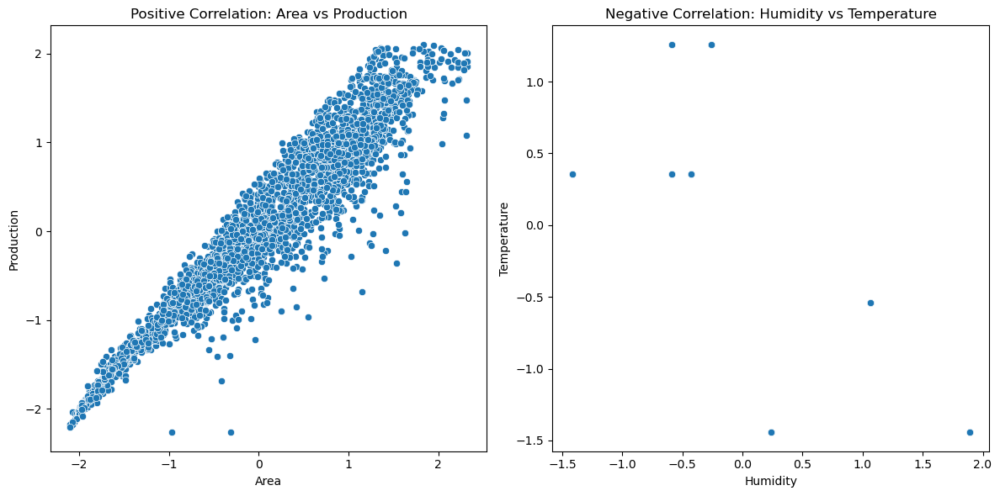

In [109]:
plt.figure(figsize=(12, 6))

# Scatter plots for top positive correlations
plt.subplot(1, 2, 1)
sns.scatterplot(data=FINAL_SCALED_DATAFRAME_AFTER_ALL_STEPS, x=top_positive_corr.iloc[0]['Feature_1'], y=top_positive_corr.iloc[0]['Feature_2'])
plt.title(f"Positive Correlation: {top_positive_corr.iloc[0]['Feature_1']} vs {top_positive_corr.iloc[0]['Feature_2']}")

# Scatter plots for top negative correlations
plt.subplot(1, 2, 2)
sns.scatterplot(data=FINAL_SCALED_DATAFRAME_AFTER_ALL_STEPS, x=top_negative_corr.iloc[0]['Feature_1'], y=top_negative_corr.iloc[0]['Feature_2'])
plt.title(f"Negative Correlation: {top_negative_corr.iloc[0]['Feature_1']} vs {top_negative_corr.iloc[0]['Feature_2']}")

plt.tight_layout()
plt.show()


In [111]:
# FINAL_SCALED_DATAFRAME_AFTER_ALL_STEPS.head(2)

FINAL_SCALED_DATAFRAME_AFTER_ALL_STEPS.shape

(3224, 20)

In [430]:
# # Load the dataset 
# FINAL_SCALED_DATAFRAME_AFTER_ALL_STEPS.hist(figsize=(10, 8), bins=30)  # Visualize distribution
# plt.show()

# # Check skewness
# print(FINAL_SCALED_DATAFRAME_AFTER_ALL_STEPS.skew()) 


## Check Correlation with Yield
##### Drop features with correlation below 0.05 (weak correlation with Yield).

In [113]:
import seaborn as sns
import matplotlib.pyplot as plt

# Compute correlation matrix
corr_matrix = FINAL_SCALED_DATAFRAME_AFTER_ALL_STEPS.corr()

# Sort correlation values with respect to Yield
corr_with_yield = corr_matrix["Yield"].sort_values(ascending=False)

# Display correlation values
print(corr_with_yield)

# Plot correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Feature Correlation Heatmap")
plt.show()


KeyError: 'Yield'

In [115]:
FINAL_SCALED_DATAFRAME_AFTER_ALL_STEPS.columns

Index(['District_Name', 'Crop_Year', 'Temperature', 'Humidity',
       'Soil_Moisture', 'Area', 'Production',
       'State_Name_Andaman and Nicobar Islands', 'State_Name_Andhra Pradesh',
       'State_Name_Arunachal Pradesh', 'State_Name_Assam', 'State_Name_Bihar',
       'State_Name_Chandigarh', 'State_Name_Chhattisgarh',
       'Season_Kharif     ', 'Season_Autumn     ', 'Season_Rabi       ',
       'Season_Whole Year ', 'Season_Summer     ', 'Season_Winter     '],
      dtype='object')

### FEATURE ENGINEERING

In [645]:
feature_eng_df = FINAL_SCALED_DATAFRAME_AFTER_ALL_STEPS.copy()

In [117]:
feature_eng_df["soil_humidity_interaction"] = feature_eng_df["Soil_Moisture"] * feature_eng_df["Humidity"]

correlation = feature_eng_df[["Yield", "Soil_Moisture", "Humidity", "soil_humidity_interaction"]].corr()
print(correlation)



NameError: name 'feature_eng_df' is not defined

Yield                           1.000000
State_Name_Andhra Pradesh       0.426370
Season_Rabi                     0.323690
Production                      0.304493
Crop_Year                       0.217318
Season_Summer                   0.181236
State_Name_Chandigarh           0.173264
Season_Whole Year               0.063777
Season_Kharif                   0.062638
Area                            0.036036
Temperature                     0.002474
State_Name_Chhattisgarh        -0.002980
Soil_Moisture                  -0.005705
State_Name_Assam               -0.012995
Humidity                       -0.016944
soil_humidity_interaction      -0.026871
Season_Winter                  -0.036760
District_Name                  -0.063439
State_Name_Arunachal Pradesh   -0.153681
State_Name_Bihar               -0.190672
Name: Yield, dtype: float64


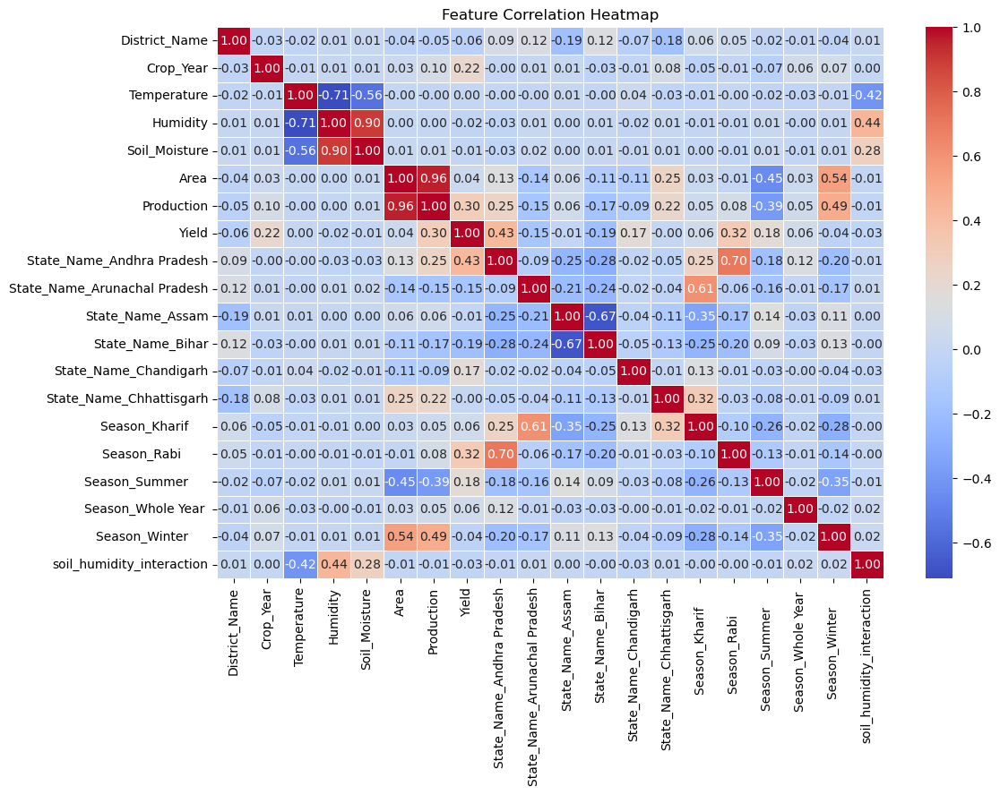

In [501]:
import seaborn as sns
import matplotlib.pyplot as plt

# Compute correlation matrix
corr_matrix = feature_eng_df.corr()

# Sort correlation values with respect to Yield
corr_with_yield = corr_matrix["Yield"].sort_values(ascending=False)

# Display correlation values
print(corr_with_yield)

# Plot correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Feature Correlation Heatmap")
plt.show()


In [666]:
print(feature_eng_df[['Soil_Moisture', 'Humidity', 'Yield']].corr())


               Soil_Moisture  Humidity     Yield
Soil_Moisture       1.000000  0.899273 -0.005705
Humidity            0.899273  1.000000 -0.016944
Yield              -0.005705 -0.016944  1.000000


## Feature Importance using RandomForest

##### Drop features with very low importance scores (< 0.01).

In [668]:
from sklearn.ensemble import RandomForestRegressor
import numpy as np

# Separate features and target variable
X = FINAL_SCALED_DATAFRAME_AFTER_ALL_STEPS.drop(columns=["Yield"])
y = FINAL_SCALED_DATAFRAME_AFTER_ALL_STEPS["Yield"]

# Train a RandomForest model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X, y)

# Get feature importance scores
importances = model.feature_importances_
feature_names = X.columns

# Sort and display feature importance
sorted_indices = np.argsort(importances)[::-1]
for i in sorted_indices:
    print(f"{feature_names[i]}: {importances[i]:.4f}")


Production: 0.2706
Area: 0.1844
State_Name_Andhra Pradesh: 0.1809
Crop_Year: 0.1237
Season_Summer     : 0.0590
Season_Autumn     : 0.0425
State_Name_Chandigarh: 0.0397
District_Name: 0.0338
State_Name_Andaman and Nicobar Islands: 0.0176
Season_Kharif     : 0.0144
State_Name_Bihar: 0.0066
State_Name_Assam: 0.0061
Soil_Moisture: 0.0055
Humidity: 0.0046
Season_Winter     : 0.0038
Temperature: 0.0038
State_Name_Arunachal Pradesh: 0.0023
Season_Rabi       : 0.0006
State_Name_Chhattisgarh: 0.0000
Season_Whole Year : 0.0000


## Recursive Feature Elimination (RFE)
##### Find the best subset of features using RFE with a regression model.  

##### Keep only the selected features for training your model.


In [670]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import Ridge  # Using Ridge Regression

# Define model and RFE selector
model = Ridge()
selector = RFE(model, n_features_to_select=5)  # Keep 10 best features

# Fit RFE
selector.fit(X, y)

# Get selected features
selected_features = X.columns[selector.support_]
print("Selected Features:", selected_features)


Selected Features: Index(['Area', 'Production', 'State_Name_Arunachal Pradesh',
       'State_Name_Chandigarh', 'Season_Autumn     '],
      dtype='object')


## Now ab mei Finalize the best features for predicting Yield based on the three methods

#####  1) High Correlation with Yield (> 0.1) (from Step 1)
#####  2) High Feature Importance (> 0.05) (from Step 2)
#####  3) Selected by RFE (Step 3)



#### Best Features for Prediction

(1) Crop_Year (Step 1 & Step 2)

(2) Production (Step 1, Step 2 & Step 3)

(3) State_Name_Andhra Pradesh (Step 1, Step 2 & Step 3)

(4) State_Name_Chandigarh (Step 1 & Step 3)

(5) Season_Rabi

(6) Season_Summer (Step 1 & Step 3)

(7) Area (Step 2 & Step 3)

no) State_Name_Bihar (Step 1 & Step 3)

no) Season_Winter (Step 3)


In [672]:
FINAL_SCALED_DATAFRAME_AFTER_ALL_STEPS

,District_Name,Crop_Year,Temperature,Humidity,Soil_Moisture,Area,Production,Yield,State_Name_Andaman and Nicobar Islands,State_Name_Andhra Pradesh,...,State_Name_Assam,State_Name_Bihar,State_Name_Chandigarh,State_Name_Chhattisgarh,Season_Kharif,Season_Autumn,Season_Rabi,Season_Whole Year,Season_Summer,Season_Winter
0,0.661999,-1.103547,0.357493,-0.424782,-0.519933,-1.701430,-1.517771,1.782679,14.624181,-0.322129,...,-0.767627,-0.876336,-0.058521,-0.146810,2.19972,-0.592759,-0.225531,-0.039418,-0.571737,-0.611893
1,0.661999,-0.908476,1.256246,-0.259595,0.370947,-1.733446,-1.532517,2.159743,14.624181,-0.322129,...,-0.767627,-0.876336,-0.058521,-0.146810,2.19972,-0.592759,-0.225531,-0.039418,-0.571737,-0.611893
2,0.661999,-0.713405,0.357493,-1.415907,-1.410814,-1.594474,-1.410716,1.378866,14.624181,-0.322129,...,-0.767627,-0.876336,-0.058521,-0.146810,2.19972,-0.592759,-0.225531,-0.039418,-0.571737,-0.611893
3,0.661999,-0.518334,0.357493,-1.415907,-1.410814,-1.799919,-1.762513,0.302380,14.624181,-0.322129,...,-0.767627,-0.876336,-0.058521,-0.146810,2.19972,-0.592759,-0.225531,-0.039418,-0.571737,-0.611893
4,0.661999,-0.323263,0.357493,-1.415907,-1.410814,-1.797522,-1.798167,-0.207557,14.624181,-0.322129,...,-0.767627,-0.876336,-0.058521,-0.146810,2.19972,-0.592759,-0.225531,-0.039418,-0.571737,-0.611893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3218,-0.639398,1.237307,-1.440012,0.235967,-0.163581,1.578063,1.452427,0.073784,-0.068380,-0.322129,...,-0.767627,-0.876336,-0.058521,6.811539,2.19972,-0.592759,-0.225531,-0.039418,-0.571737,-0.611893
3219,-0.639398,1.432378,-1.440012,0.235967,-0.163581,1.596150,1.421345,-0.046486,-0.068380,-0.322129,...,-0.767627,-0.876336,-0.058521,6.811539,2.19972,-0.592759,-0.225531,-0.039418,-0.571737,-0.611893
3220,-0.372445,-0.908476,0.357493,-1.415907,-1.410814,2.293136,2.008953,0.006127,-0.068380,-0.322129,...,-0.767627,-0.876336,-0.058521,6.811539,2.19972,-0.592759,-0.225531,-0.039418,-0.571737,-0.611893
3221,-0.372445,-0.518334,0.357493,-1.415907,-1.410814,2.284783,1.894366,-0.237936,-0.068380,-0.322129,...,-0.767627,-0.876336,-0.058521,6.811539,2.19972,-0.592759,-0.225531,-0.039418,-0.571737,-0.611893


In [330]:
# # from sklearn.preprocessing import StandardScaler, OneHotEncoder
# # from sklearn.compose import ColumnTransformer

# # # Define categorical and numerical features
# # # categorical_features = ['State_Name', 'District_Name', 'Season']
# # numerical_features = ['Crop_Year', 'Temperature', 'Humidity', 'Soil_Moisture', 'Area', 'Production', 'Yield']

# # # Initialize transformers
# # scaler = StandardScaler()
# # # one_hot_encoder = OneHotEncoder(handle_unknown='ignore')

# # # Apply transformations
# # preprocessor = ColumnTransformer(
# #     transformers=[
# #         ('num', scaler, numerical_features),
# #         ('cat', one_hot_encoder, categorical_features)
# #     ]
# # )

# # # Fit and transform the dataset
# # df_scaled = preprocessor.fit_transform(rice_dataframe_withoutCrop)

# # # Convert to DataFrame
# # df_scaled = pd.DataFrame(df_scaled)

# # # Check the transformed data
# # print(df_scaled.head())





# from sklearn.preprocessing import StandardScaler

# # # List of all features (since categorical are already encoded)
# # features = ['Crop_Year', 'Temperature', 'Humidity', 'Soil_Moisture', 'Area', 'Production', 'Yield']  # + encoded categorical features

# # Initialize StandardScaler
# scaler = StandardScaler()

# # Fit and transform the entire dataset
# df_scaled = scaler.fit_transform(df_encoded)

# # Convert to DataFrame
# df_scaled = pd.DataFrame(df_scaled, columns=df_encoded.columns)

# # Check the transformed dataset
# print(df_scaled.head())


In [332]:
# df_scaled

In [336]:
# # Adding a new column Yield which indicates Production per unit Area. 

# df_rice['Yield'] = (df_rice['Production'] / df_rice['Area'])
# df_rice.tail() 



In [346]:
# df_rice.info()

In [344]:
# rice_correlation_df = df_rice[['Crop_Year','Temperature','Humidity','Soil_Moisture','Area','Production','Yield']]

# corr = rice_correlation_df.corr()

# corr

In [350]:
 ## FEATURE ENGINEERING 

### 1) CREATING RICE CROP YEILD WITH COLUMN NAME AS "YEILD" IN CURRENT DATASET -->

In [121]:
# plt.figure(figsize=(8, 8))


# g = sns.heatmap(corr, annot=True, cmap = 'PuBuGn_r', square=True, linewidth=1, cbar_kws={'fraction' : 0.02})

# g.set_yticklabels(g.get_yticklabels(), rotation=0, horizontalalignment='right')

# g.set_title("Correlation Among All Features", fontsize=14)
# #bottom, top = g.get_ylim()
# #g.set_ylim(bottom + 0.5, top + 0.5)

# plt.show()

In [338]:

# plt.figure(figsize=(10, 6))
# sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, vmin=-1, vmax=1)
# plt.title("Correlation Among All Features")
# plt.show()


In [375]:
# CONVERTING CATEGORICAL TO NUMERICAL AND SCALING VALUES -->

In [377]:
# # Check unique season values
# print(df_rice["Season"].unique())


In [379]:
# # Encode the Season Column
# # df_encoded = pd.get_dummies(df_rice, columns=["Season"], drop_first=True)  # Drop first column to avoid multicollinearity

# # df_encoded

# from sklearn.preprocessing import OneHotEncoder, StandardScaler
# from sklearn.compose import ColumnTransformer


# # #  Label Encoding (If you want a single numerical column)
# # le = LabelEncoder()
# # df_rice["Season_Label"] = le.fit_transform(df_rice["Season"])

# # df_rice.head(100)



# ohe = OneHotEncoder(drop='first')
# scaler = StandardScaler()


# preprocessor = ColumnTransformer(
#     transformers=[
#         ("onehotencoder",ohe,[]),
#         (),
#     ]
# )

In [381]:
  # Compute Correlation Between Season and Yield 

In [383]:
# season_correlation_with_rice_df = df_rice[['Crop_Year','Temperature','Humidity','Soil_Moisture','Area','Production','Yield','Season_Label']]


# correlation_matrix = season_correlation_with_rice_df.corr()

# # Extract correlation between Season and Yield
# season_correlation = correlation_matrix["Yield"].sort_values(ascending=False)
# print(season_correlation)


In [385]:
# season_correlation_with_rice_df

In [387]:
# plt.figure(figsize=(10, 6))
# sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
# plt.title("Correlation Between Season and Yield")
# plt.show()


In [195]:
# plt.figure(figsize=(8, 8))


# g = sns.heatmap(correlation_matrix, annot=True, cmap = 'PuBuGn_r', square=True, linewidth=1, cbar_kws={'fraction' : 0.02})

# g.set_yticklabels(g.get_yticklabels(), rotation=0, horizontalalignment='right')

# g.set_title("Correlation between Area, Production & Rainfall", fontsize=14)
# #bottom, top = g.get_ylim()
# #g.set_ylim(bottom + 0.5, top + 0.5)

# plt.show()

Now we can successfully drop the un-necessary Columns/Features from the dataset

In [420]:
# df_rice

In [422]:
# FINAL_RICE_DATAFRAME_AFTER_CHECKING_ALL_CORRELATIONS = df_rice[['Crop_Year','Temperature','Humidity','Soil_Moisture','Area','Production','Yield']]


# FINAL_RICE_DATAFRAME_AFTER_CHECKING_ALL_CORRELATIONS

In [77]:
# FINAL_RICE_DATAFRAME_AFTER_CHECKING_ALL_CORRELATIONS

In [424]:
# FINAL_RICE_DATAFRAME_AFTER_CHECKING_ALL_CORRELATIONS

In [ ]:
# DATA - NORMALIZATION 

In [432]:
 # Check Data Distribution

 # Before deciding whether to use MinMaxScaler (Normalization) or StandardScaler (Standardization), let's first check the distribution of the dataset

In [434]:
# from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV,cross_val_score
# from sklearn.linear_model import LinearRegression
# from sklearn.ensemble import RandomForestRegressor
# from xgboost import XGBRegressor
# from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
# from sklearn.preprocessing import MinMaxScaler, StandardScaler


# riceDF = FINAL_RICE_DATAFRAME_AFTER_CHECKING_ALL_CORRELATIONS
# # Feature Engineering: Creating new features
# riceDF["Production_per_Area"] = riceDF["Production"] / (riceDF["Area"] + 1)  # Avoid division by zero

# riceDF["Humidity_Soil_Interaction"] = riceDF["Humidity"] * riceDF["Soil_Moisture"]


# # Selecting important features
# selected_features = ["Crop_Year","Area","Production","Production_per_Area", "Humidity_Soil_Interaction"]

# X = riceDF[selected_features]

# y = riceDF["Yield"]


# # Train-test split
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [438]:
# riceDF

In [440]:
# X

In [442]:
# y

In [444]:
# X_train

In [446]:
# # Load the dataset 
# FINAL_RICE_DATAFRAME_AFTER_CHECKING_ALL_CORRELATIONS.hist(figsize=(10, 8), bins=30)  # Visualize distribution
# plt.show()

# # Check skewness
# print(FINAL_RICE_DATAFRAME_AFTER_CHECKING_ALL_CORRELATIONS.skew()) 


In [ ]:
# If the values follow a normal distribution, use StandardScaler


# If the values are skewed, use MinMaxScaler

In [448]:
# import pandas as pd
# from sklearn.preprocessing import MinMaxScaler, StandardScaler



# # Initialize scalers
# minmax_scaler = MinMaxScaler()                #data is skewed isliye mene ye use kiya h !!!
# standard_scaler = StandardScaler()            #data is normally distributed but agar i want to scale in common point 

# # Columns to normalize (MinMaxScaler: scales between 0 and 1)
# columns_to_normalize = ["Area", "Production"]
# FINAL_RICE_DATAFRAME_AFTER_CHECKING_ALL_CORRELATIONS[columns_to_normalize] = minmax_scaler.fit_transform(FINAL_RICE_DATAFRAME_AFTER_CHECKING_ALL_CORRELATIONS[columns_to_normalize])



# # Columns to standardize (StandardScaler: mean = 0, std = 1)
# columns_to_standardize = ["Temperature", "Humidity", "Soil_Moisture", "Yield"]
# FINAL_RICE_DATAFRAME_AFTER_CHECKING_ALL_CORRELATIONS[columns_to_standardize] = standard_scaler.fit_transform(FINAL_RICE_DATAFRAME_AFTER_CHECKING_ALL_CORRELATIONS[columns_to_standardize])

# # Display first few rows
# print(FINAL_RICE_DATAFRAME_AFTER_CHECKING_ALL_CORRELATIONS.head())



In [450]:
# FINAL_RICE_DATAFRAME_AFTER_CHECKING_ALL_CORRELATIONS

In [452]:
# correlation_matrix = FINAL_RICE_DATAFRAME_AFTER_CHECKING_ALL_CORRELATIONS.corr()

# # Plot correlation heatmap
# plt.figure(figsize=(8, 6))
# sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
# plt.title("Correlation Matrix After Scaling")
# plt.show()

In [454]:
# NOW I'LL PERFORM FEATURE ENGINEERING 

In [458]:
# FINAL_RICE_DATAFRAME_AFTER_CHECKING_ALL_CORRELATIONS

In [460]:
# riceDF = FINAL_RICE_DATAFRAME_AFTER_CHECKING_ALL_CORRELATIONS
# # Feature Engineering: Creating new features
# riceDF["Production_per_Area"] = riceDF["Production"] / (riceDF["Area"] + 1)  # Avoid division by zero

# riceDF["Humidity_Soil_Interaction"] = riceDF["Humidity"] * riceDF["Soil_Moisture"]


# # Selecting important features
# selected_features = ["Crop_Year","Area","Production","Production_per_Area", "Humidity_Soil_Interaction"]

# X = riceDF[selected_features]

# y = riceDF["Yield"]





In [462]:
# X  #THIS IS MY ENTIRE DATASET

In [464]:
# y    #THIS IS MY ENTIRE DATASET

TRAIN - TEST SPLIT

In [ ]:
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV,cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Normalization and Standardization
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Models to compare
models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
    "XGBoost": XGBRegressor(n_estimators=100, random_state=42)
}

# Training and evaluation
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))

    print(f"\n{name} :-  \n(1) R²: {r2:.4f}\n(2) MAE: {mae:.4f}\n(3) RMSE: {rmse:.4f}")



Linear Regression :-  
(1) R²: 0.5270
(2) MAE: 0.5150
(3) RMSE: 0.7071

Random Forest :-  
(1) R²: 0.9738
(2) MAE: 0.0874
(3) RMSE: 0.1663

XGBoost :-  
(1) R²: 0.9790
(2) MAE: 0.0927
(3) RMSE: 0.1489


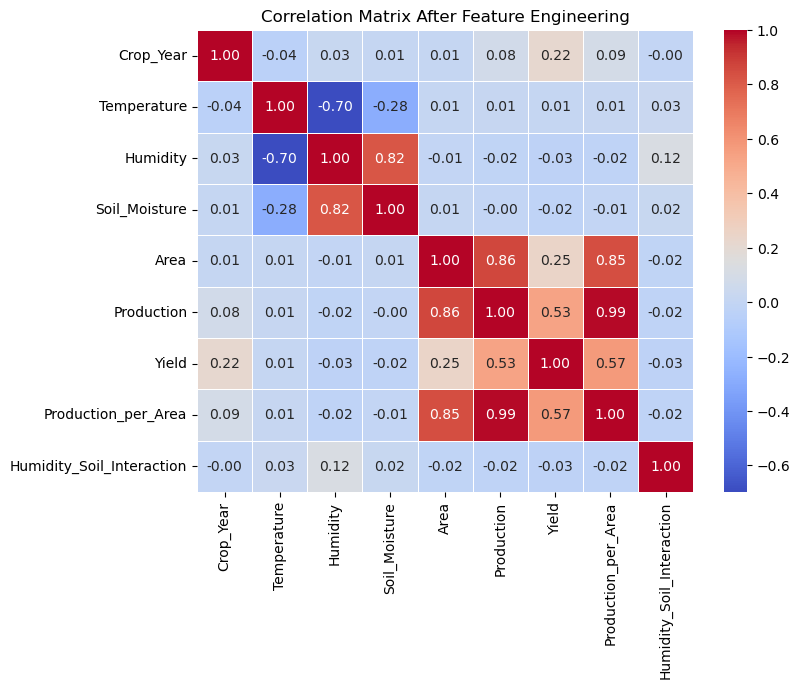

In [36]:

# Correlation Matrix after Feature Engineering
plt.figure(figsize=(8, 6))
sns.heatmap(riceDF.corr(), annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix After Feature Engineering")
plt.show()


PERFORMING Hyperparameter Tuning for the best model NOW !!

In [37]:
# Hyperparameter tuning for the best model (XGBoost)
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 7]
}
grid_search = GridSearchCV(XGBRegressor(random_state=42), param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best model training
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))



print(f"Best XGBoost Model - \n(1)R²: {r2:.4f}\n(2) MAE: {mae:.4f}\n(3) RMSE: {rmse:.4f}")
print(f"\nBest Hyperparameters :----> \n{grid_search.best_params_}")

Best XGBoost Model - 
(1)R²: 0.9824
(2) MAE: 0.0795
(3) RMSE: 0.1366

Best Hyperparameters :----> 
{'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200}


In [244]:

# # Correlation Matrix after Feature Engineering
# plt.figure(figsize=(8, 6))
# sns.heatmap(riceDF.corr(), annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
# plt.title("Correlation Matrix After Feature Engineering")
# plt.show()

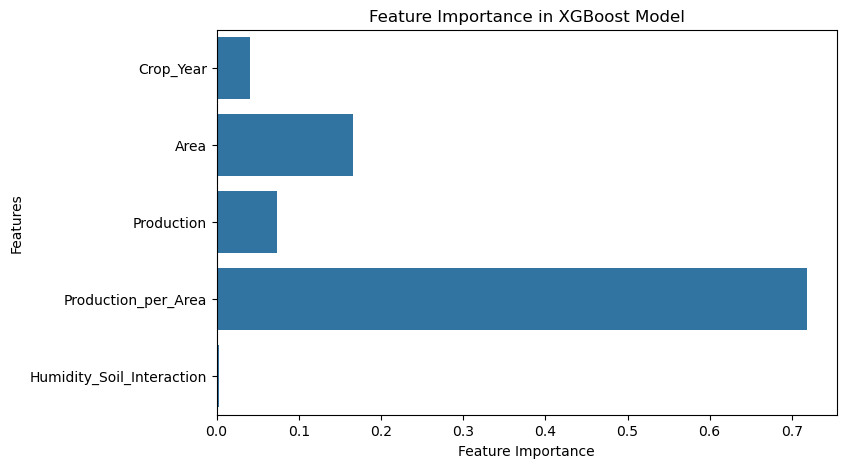

In [38]:
#  Feature Importance Plot
plt.figure(figsize=(8, 5))
sns.barplot(x=best_model.feature_importances_, y=selected_features)
plt.xlabel("Feature Importance")
plt.ylabel("Features")
plt.title("Feature Importance in XGBoost Model")
plt.show()


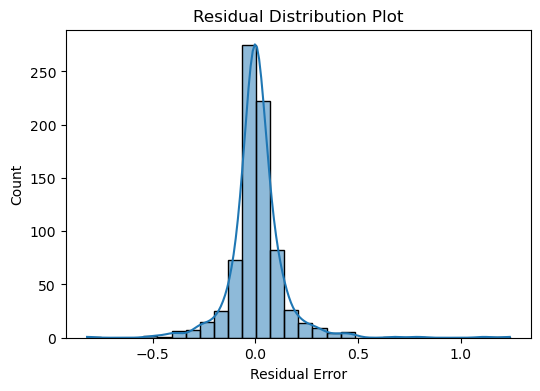

In [39]:

# Residual Plot
plt.figure(figsize=(6, 4))
sns.histplot(y_test - y_pred, bins=30, kde=True)
plt.xlabel("Residual Error")
plt.title("Residual Distribution Plot")
plt.show()

COMPARING OTHER ALGORITHMS

In [40]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error



# Models
models = {
    # "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(),
    "Lasso Regression": Lasso(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    # "Random Forest": RandomForestRegressor(random_state=42),
    # "XGBoost": XGBRegressor(random_state=42),
    "SVR": SVR(),
    "KNN Regressor": KNeighborsRegressor(),
    "Polynomial Regression": LinearRegression()
}

# Polynomial Features for Polynomial Regression
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

results = {}
for name, model in models.items():
    if name == "Polynomial Regression":
        model.fit(X_train_poly, y_train)
        y_pred = model.predict(X_test_poly)
    else:
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    results[name] = {"R²": r2, "MAE": mae, "RMSE": rmse}

# Display results
for model, metrics in results.items():
    print(f"\n{model}: \nR²={metrics['R²']:.4f}, \nMAE={metrics['MAE']:.4f}, \nRMSE={metrics['RMSE']:.4f}")


# # Hyperparameter tuning for the best model (XGBoost)
# param_grid = {
#     'n_estimators': [50, 100, 200],
#     'learning_rate': [0.01, 0.05, 0.1],
#     'max_depth': [3, 5, 7]
# }
# grid_search = GridSearchCV(XGBRegressor(random_state=42), param_grid, cv=5, scoring='r2', n_jobs=-1)
# grid_search.fit(X_train, y_train)

# # Best model training
# best_model = grid_search.best_estimator_
# y_pred = best_model.predict(X_test)
# r2 = r2_score(y_test, y_pred)
# mae = mean_absolute_error(y_test, y_pred)
# rmse = np.sqrt(mean_squared_error(y_test, y_pred))

# print(f"Best XGBoost Model - R²: {r2:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}")
# print(f"Best Hyperparameters: {grid_search.best_params_}")











# Correlation Matrix after Feature Engineering
# plt.figure(figsize=(8, 6))
# sns.heatmap(riceDF.corr(), annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
# plt.title("Correlation Matrix After Feature Engineering")
# plt.show()

# Feature Importance Plot
# plt.figure(figsize=(8, 5))
# sns.barplot(x=best_model.feature_importances_, y=selected_features)
# plt.xlabel("Feature Importance")
# plt.ylabel("Features")
# plt.title("Feature Importance in XGBoost Model")
# plt.show()

# # Residual Plot
# plt.figure(figsize=(6, 4))
# sns.histplot(y_test - y_pred, bins=30, kde=True)
# plt.xlabel("Residual Error")
# plt.title("Residual Distribution Plot")
# plt.show()



Ridge Regression: 
R²=0.5268, 
MAE=0.5152, 
RMSE=0.7072

Lasso Regression: 
R²=-0.0004, 
MAE=0.8044, 
RMSE=1.0283

Decision Tree: 
R²=0.9544, 
MAE=0.1400, 
RMSE=0.2196

SVR: 
R²=0.7463, 
MAE=0.3020, 
RMSE=0.5178

KNN Regressor: 
R²=0.6228, 
MAE=0.4307, 
RMSE=0.6314

Polynomial Regression: 
R²=0.6895, 
MAE=0.3886, 
RMSE=0.5729



Ridge Regression: 
R²=0.5268, 
MAE=0.5152, 
RMSE=0.7072

Lasso Regression: 
R²=0.3812, 
MAE=0.6281, 
RMSE=0.8088

Decision Tree: 
R²=0.9544, 
MAE=0.1400, 
RMSE=0.2196

Random Forest: 
R²=0.9741, 
MAE=0.0882, 
RMSE=0.1656

SVR: 
R²=0.7928, 
MAE=0.2516, 
RMSE=0.4681

KNN Regressor: 
R²=0.6040, 
MAE=0.4431, 
RMSE=0.6470

Polynomial Regression: 
R²=0.6895, 
MAE=0.3886, 
RMSE=0.5729


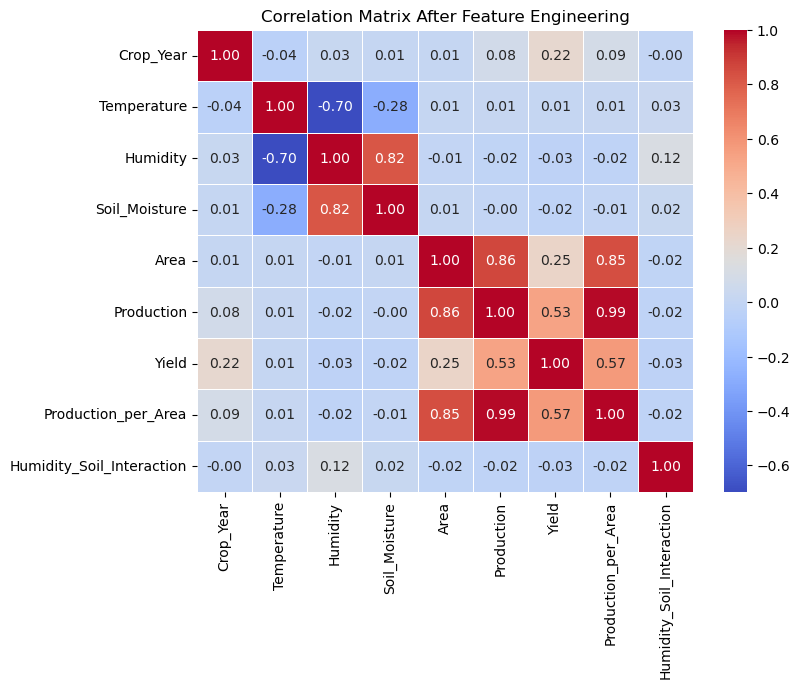

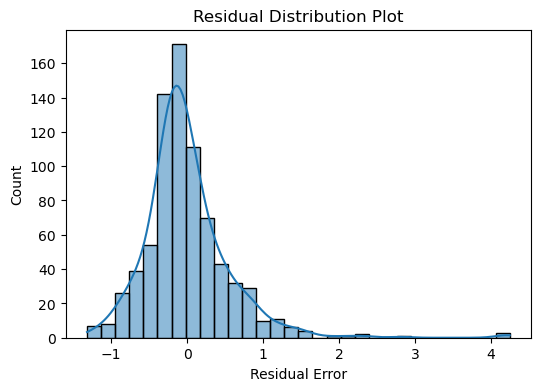

In [41]:
# Hyperparameter tuning parameters
param_grid = {
    "Decision Tree": {"max_depth": [3, 5, 10, None]},
    "Random Forest": {"n_estimators": [10, 50, 100], "max_depth": [3, 5, 10, None]},
    "SVR": {"C": [0.1, 1, 10], "kernel": ["linear", "rbf"]},
    "KNN Regressor": {"n_neighbors": [3, 5, 7]},
    "Ridge Regression": {"alpha": [0.1, 1, 10]},
    "Lasso Regression": {"alpha": [0.1, 1, 10]}
}

# Models
models = {
    # "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(),
    "Lasso Regression": Lasso(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "Random Forest": RandomForestRegressor(random_state=42),
    "SVR": SVR(),
    "KNN Regressor": KNeighborsRegressor(),
    "Polynomial Regression": LinearRegression()
}

# Polynomial Features for Polynomial Regression
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

results = {}
for name, model in models.items():
    if name in param_grid:
        
        
        grid_search = GridSearchCV(model, param_grid[name], cv=5, scoring='r2')
        grid_search.fit(X_train, y_train)
        best_model = grid_search.best_estimator_

        # random_search = RandomizedSearchCV(model, param_grid[name], cv=5, scoring='r2', n_iter=20, random_state=42)
        # random_search.fit(X_train, y_train)
        # best_model = random_search.best_estimator_




    else:
        best_model = model
    
    if name == "Polynomial Regression":
        best_model.fit(X_train_poly, y_train)
        y_pred = best_model.predict(X_test_poly)
    else:
        best_model.fit(X_train, y_train)
        y_pred = best_model.predict(X_test)
    
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    results[name] = {"R²": r2, "MAE": mae, "RMSE": rmse}

# Display results
for model, metrics in results.items():
    print(f"\n{model}: \nR²={metrics['R²']:.4f}, \nMAE={metrics['MAE']:.4f}, \nRMSE={metrics['RMSE']:.4f}")







# Correlation Matrix after Feature Engineering
plt.figure(figsize=(8, 6))
sns.heatmap(riceDF.corr(), annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix After Feature Engineering")
plt.show()

# Residual Plot
plt.figure(figsize=(6, 4))
sns.histplot(y_test - y_pred, bins=30, kde=True)
plt.xlabel("Residual Error")
plt.title("Residual Distribution Plot")
plt.show()


In [45]:
#   # Feature Importance for Tree-based models 


# #  Feature Importance Plot
# plt.figure(figsize=(8, 5))
# sns.barplot(x=best_model.feature_importances_, y=selected_features)
# plt.xlabel("Feature Importance")
# plt.ylabel("Features")
# plt.title("Feature Importance in XGBoost Model")
# plt.show()

# 
# JAISE XG KE LIYE FEATURE IMPORTANCE GRAPH BNAYA H WAISA HI SAME DECISION TREE,RANDOM FOREST KE LIYE BNAYA H NEECHE CODE MEI

decision tree, random forest and XGBoost model are giving the highest r2 score

In [46]:
# # # Models
# models = {
#     # "Linear Regression": LinearRegression(),
#     # "Ridge Regression": Ridge(),
#     # "Lasso Regression": Lasso(),
#     "Decision Tree": DecisionTreeRegressor(random_state=42),
#     "Random Forest": RandomForestRegressor(random_state=42),
#     # "XGBoost": XGBRegressor(n_estimators=200, random_state=42)
#     # "SVR": SVR(),
#     # "KNN Regressor": KNeighborsRegressor(),
#     # "Polynomial Regression": LinearRegression()
# }

# # Polynomial Features for Polynomial Regression
# poly = PolynomialFeatures(degree=2)
# X_train_poly = poly.fit_transform(X_train)
# X_test_poly = poly.transform(X_test)

# results = {}

# feature_importance = {}

# for name, model in models.items():
#     if name in param_grid:
#         # random_search = RandomizedSearchCV(model, param_grid[name], cv=5, scoring='r2', n_iter=30, random_state=42)
#         # random_search.fit(X_train, y_train)
#         # best_model = random_search.best_estimator_
        
#         grid_search = GridSearchCV(model, param_grid[name], cv=5, scoring='r2')
#         grid_search.fit(X_train, y_train)
#         best_model = grid_search.best_estimator_


#     else:
#         best_model = model
    
#     if name == "Polynomial Regression":
#         best_model.fit(X_train_poly, y_train)
#         y_pred = best_model.predict(X_test_poly)
#     else:
#         best_model.fit(X_train, y_train)
#         y_pred = best_model.predict(X_test)
    
#     r2 = r2_score(y_test, y_pred)
#     mae = mean_absolute_error(y_test, y_pred)
#     rmse = np.sqrt(mean_squared_error(y_test, y_pred))
#     results[name] = {"R²": r2, "MAE": mae, "RMSE": rmse}
    
#     # Feature Importance for Tree-based models
#     if name in ["Random Forest", "Decision Tree"]:
#         feature_importance[name] = best_model.feature_importances_

# # Display results
# for model, metrics in results.items():
#     print(f"{model}: R²={metrics['R²']:.4f}, MAE={metrics['MAE']:.4f}, RMSE={metrics['RMSE']:.4f}")

# # Feature Importance Plot
# for model, importance in feature_importance.items():
#     plt.figure(figsize=(8, 4))
#     sns.barplot(x=selected_features, y=importance)
#     plt.title(f"Feature Importance - {model}")
#     plt.xticks(rotation=45)
#     plt.show()


CROSS VALIDATION

In [ ]:
# # Models
# BEST_MODELS = {
    
#     "Decision Tree": DecisionTreeRegressor(random_state=42),
#     "Random Forest": RandomForestRegressor(random_state=42),
#     "XGBoost": XGBRegressor(n_estimators=200,random_state=42)

# }
    

# # Cross-Validation for Stability
# for name, model in models.items():
#     scores = cross_val_score(model, X, y, cv=5, scoring='r2')
#     print(f"{name} Cross-Validation R²: {np.mean(scores):.4f}")







# # # Correlation Matrix after Feature Engineering
# # plt.figure(figsize=(8, 6))
# # sns.heatmap(riceDF.corr(), annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
# # plt.title("Correlation Matrix After Feature Engineering")
# # plt.show()

# # # Residual Plot
# # plt.figure(figsize=(6, 4))
# # sns.histplot(y_test - y_pred, bins=30, kde=True)
# # plt.xlabel("Residual Error")
# # plt.title("Residual Distribution Plot")
# # plt.show()





Decision Tree Cross-Validation R²: 0.8357
Random Forest Cross-Validation R²: 0.8639
XGBoost Cross-Validation R²: 0.8980


In [60]:
import time
import psutil
import os
import platform

In [83]:
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV,cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Normalization and Standardization
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

y_scaler = StandardScaler()
y_train = y_scaler.fit_transform(y_train.values.reshape(-1, 1)).ravel()


# # Models to compare
# models = {
#     "Linear Regression": LinearRegression(),
#     "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
#     "XGBoost": XGBRegressor(n_estimators=100, random_state=42)
# }

# # Training and evaluation
# for name, model in models.items():
#     model.fit(X_train, y_train)
#     y_pred = model.predict(X_test)
#     r2 = r2_score(y_test, y_pred)
#     mae = mean_absolute_error(y_test, y_pred)
#     rmse = np.sqrt(mean_squared_error(y_test, y_pred))

#     print(f"\n{name} :-  \n(1) R²: {r2:.4f}\n(2) MAE: {mae:.4f}\n(3) RMSE: {rmse:.4f}")

print("X DATA" , X , "----------------------------------\n\n\n")

print("small y DATA" , y , "----------------------------------\n\n\n")



print("Xtrain DATA" , X_train , "\n\n\n")




X DATA        Crop_Year      Area  Production  Production_per_Area  \
2           2000  0.000217    0.000198             0.000198   
12          2001  0.000176    0.000185             0.000185   
18          2002  0.000404    0.000314             0.000314   
27          2003  0.000110    0.000056             0.000056   
36          2004  0.000112    0.000045             0.000045   
...          ...       ...         ...                  ...   
49629       2002  0.543140    0.184102             0.119303   
49666       2003  0.544088    0.210542             0.136354   
49704       2004  0.543905    0.193600             0.125396   
49740       2005  0.545289    0.278807             0.180424   
49777       2006  0.599400    0.325486             0.203505   

       Humidity_Soil_Interaction  
2                       0.343897  
12                     -0.150042  
18                      2.254037  
27                      2.254037  
36                      2.254037  
...                       

In [84]:
# print(X_test)

In [85]:
# print(y_train)


# # Print statistics of y_train after scaling
# print("\n\ny_train Statistics After Scaling:")
# print(f"Mean: {np.mean(y_train):.4f}")
# print(f"Std Dev: {np.std(y_train):.4f}")
# print(f"Min: {np.min(y_train):.4f}")
# print(f"Max: {np.max(y_train):.4f}")


In [86]:
# print(y_test)

In [ ]:



#  Model Selection
models = {
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "Random Forest": RandomForestRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42)
}

# Hyperparameter tuning parameters
param_grid = {
    "Decision Tree": {"max_depth": [3, 5, 10, None]},

    "Random Forest": {"n_estimators": [10, 50, 100], "max_depth": [3, 5, 10, None]},
    
    "XGBoost" : {"n_estimators": [50, 100, 200],'learning_rate': [0.01, 0.05, 0.1],'max_depth': [3, 5, 7]}
}




results = {}
feature_importance = {}

for name, model in models.items():

    print(f"Training {name}...")
    start_time = time.time()
    
    grid_search = GridSearchCV(model, param_grid[name], cv=5, scoring='r2')
    grid_search.fit(X_train, y_train)
    # best_model = grid_search.best_estimator_
    models[name] = grid_search.best_estimator_        # Store the best trained model inside models dictionary
    
    y_pred = models[name].predict(X_test)
    y_pred = y_scaler.inverse_transform(y_pred.reshape(-1, 1)).ravel()

   

    end_time = time.time()
    training_time = end_time - start_time

    # random_search = RandomizedSearchCV(model, param_grid[name], cv=5, scoring='r2', n_iter=30, random_state=42)
    # random_search.fit(X_train, y_train)
    # best_model = random_search.best_estimator_
    
    # best_model.fit(X_train, y_train)
    # y_pred = best_model.predict(X_test)
    
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    results[name] = {"R²": r2, "MAE": mae, "RMSE": rmse}

    print(f"{model} - \n(1)R²: {r2:.4f}\n(2) MAE: {mae:.4f}\n(3) RMSE: {rmse:.4f}")
    print(f"\n\nBest Hyperparameters :----> \n{grid_search.best_params_}")            #random_search.best_estimator_        #grid_search.best_params_  yha ye best.estimators try krke dekh change hua kuch aacuracy ????? + random ki jgh grdi use krke dekh

    
    # Feature Importance for Tree-based models
    if name in ["Random Forest", "Decision Tree", "XGBoost"]:
        feature_importance[name] = best_model.feature_importances_

# Display results
for model, metrics in results.items():
    print(f"\nCONCLUSIONS :- \n{model}: R²={metrics['R²']:.4f}, MAE={metrics['MAE']:.4f}, RMSE={metrics['RMSE']:.4f}")

# # Feature Importance Plot
# for model, importance in feature_importance.items():
#     plt.figure(figsize=(8, 4))
#     sns.barplot(x=selected_features, y=importance)
#     plt.title(f"Feature Importance - {model}")
#     plt.xticks(rotation=45)
#     plt.show()

# Cross-Validation for Stability
cv_results = {}
for name, model in models.items():
    scores = cross_val_score(model, X_train, y_train, cv=5, scoring='r2')                              # cv = 5 folds , The model is trained on cv-1 folds and tested on the remaining fold
    cv_results[name] = np.mean(scores)                                                                 # Here, cross-validation is performed only on the training data (X_train, y_train), Since I've already done train_test_split, I should go with xtrain,ytrain
    print(f"\n{name} Cross-Validation R²: {cv_results[name]:.4f}")

# for name, model in models.items():
#     scores = cross_val_score(model, X, y, cv=5, scoring='r2')
#     print(f"{name} Cross-Validation R²: {np.mean(scores):.4f}")     #CROSS VAL. ON ENTIRE DATASET H YE STATEMENTS




# # Correlation Matrix after Feature Engineering
# plt.figure(figsize=(8, 6))
# sns.heatmap(riceDF.corr(), annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
# plt.title("Correlation Matrix After Feature Engineering")
# plt.show()

# # Residual Plot
# plt.figure(figsize=(6, 4))
# sns.histplot(y_test - y_pred, bins=30, kde=True)
# plt.xlabel("Residual Error")
# plt.title("Residual Distribution Plot")
# plt.show()








# # Resource Considerations
# print("\n\n\n\n\n\nResource Considerations:")
# print(f"- System: {platform.system()} {platform.release()}")
# print(f"- CPU Cores: {psutil.cpu_count(logical=True)}")
# print(f"- RAM Usage: {psutil.virtual_memory().used / (1024 ** 3):.2f} GB / {psutil.virtual_memory().total / (1024 ** 3):.2f} GB")
# print("- Training Decision Trees and Random Forests is computationally efficient.")
# print("- Using GPUs is beneficial for deep learning models but unnecessary for our tabular data.")



Training Decision Tree...
DecisionTreeRegressor(random_state=42) - 
(1)R²: 0.9450
(2) MAE: 0.1414
(3) RMSE: 0.2412


Best Hyperparameters :----> 
{'max_depth': None}
Training Random Forest...
RandomForestRegressor(random_state=42) - 
(1)R²: 0.9734
(2) MAE: 0.0887
(3) RMSE: 0.1677


Best Hyperparameters :----> 
{'max_depth': None, 'n_estimators': 50}
Training XGBoost...
XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
        

In [52]:

# # selected_features = ["Production", "Area", "Crop_Year", "Production_per_Area", "Humidity_Soil_Interaction"]

# # Predict on new data (example input)
# new_data = np.array([[0.000198, 0.000217, 2000, 0.000198, 0.343897]])  # Example values
# new_data_scaled = scaler.transform(new_data)  # Use already fitted scaler
# predicted_yield = models["Random Forest"].predict(new_data_scaled)
# print(f"Predicted Yield: {predicted_yield[0]:.4f}")



In [ ]:
random_search = RandomizedSearchCV(model, param_grid[name], cv=5, scoring='r2', n_iter=30, random_state=42) 

4 is less than n_iter=30

In [ ]:
# BEST_MODELS = {
    
#     "Decision Tree": DecisionTreeRegressor(random_state=42),
#     "Random Forest": RandomForestRegressor(random_state=42),
#     "XGBoost": XGBRegressor(n_estimators=200,random_state=42)

# }
    

# # Cross-Validation for Stability
# for name, model in models.items():
#     scores = cross_val_score(model, X, y, cv=5, scoring='r2')
#     print(f"{name} Cross-Validation R²: {np.mean(scores):.4f}")
# ------------------------------------------------------------------------------------------------------
# Decision Tree Cross-Validation R²: 0.8357
# Random Forest Cross-Validation R²: 0.8639
# XGBoost Cross-Validation R²: 0.8980

# ------------------------------------------------------------------------------------------------------




# ------------------------------------------------------------------------------------------------------
# Decision Tree Cross-Validation R²: 0.9030
# Random Forest Cross-Validation R²: 0.9377
# XGBoost Cross-Validation R²: 0.9610
# ------------------------------------------------------------------------------------------------------

In [94]:
riceDF.head(20)

,Crop_Year,Temperature,Humidity,Soil_Moisture,Area,Production,Yield,Production_per_Area,Humidity_Soil_Interaction
2,2000,0.462466,-0.577613,-0.595376,0.000217,0.000198,1.747361,0.000198,0.343897
12,2001,0.741002,-0.429901,0.349015,0.000176,0.000185,2.307687,0.000185,-0.150042
18,2002,0.462466,-1.463882,-1.539767,0.000404,0.000314,1.211420,0.000314,2.254037
27,2003,0.462466,-1.463882,-1.539767,0.000110,0.000056,0.053409,0.000056,2.254037
36,2004,0.462466,-1.463882,-1.539767,0.000112,0.000045,-0.382051,0.000045,2.254037
45,2005,0.462466,-1.463882,-1.539767,0.000002,0.000007,4.892188,0.000007,2.254037
62,2010,0.741002,-0.725324,-1.350889,0.000005,0.000006,1.399805,0.000006,0.979832
79,2000,0.462466,-1.463882,-1.539767,0.023162,0.019616,1.518348,0.019172,2.254037
90,2001,0.462466,-0.577613,-0.595376,0.020882,0.016643,1.309417,0.016302,0.343897
96,2006,-2.601426,1.490348,0.349015,0.014728,0.011694,1.296948,0.011525,0.520154


In [ ]:
# selected_features = ["Production", "Area", "Crop_Year", "Production_per_Area", "Humidity_Soil_Interaction"]

# Predict on new data (example input)
# new_data = np.array([[0.000198, 0.000217, 2000, 0.000198, 0.343897]])  # Example values
# new_data = np.array([[0.325486	,0.830374, 2006, 0.203505, 0.599400]])  
                    # "production","humidity_soil_inter","year" ,"prodcution per area","area" 


selected_features = ["Production", "Area", "Crop_Year", "Production_per_Area", "Humidity_Soil_Interaction"]

# Predict on new data (example input)
new_data = np.array([[0.000007,0.000002,2005,0.000007,2.254037]])  # Example values
new_data_scaled = scaler.transform(new_data)  # Use already fitted scaler

# Print the scaled values
print("Scaled new data:", new_data_scaled)

# Make prediction
predicted_yield_scaled = models["Random Forest"].predict(new_data_scaled)
predicted_yield = y_scaler.inverse_transform(predicted_yield_scaled.reshape(-1, 1)).ravel()[0]
print(f"Predicted Yield: {predicted_yield:.4f}")

predicted_yield_scaled = models["Random Forest"].predict(new_data_scaled).reshape(-1, 1)  # Ensure correct shape
predicted_yield = y_scaler.inverse_transform(predicted_yield_scaled)  # Inverse transform

predicted_yield = y_scaler.inverse_transform(predicted_yield_scaled.reshape(-1, 1)).ravel()[0]

# print(f"Corrected Predicted Yield: {predicted_yield[0]:.4f}")  # Print the fixed value
print(f"Predicted Yield: {float(predicted_yield[0]):.4f}") 

# new_data_scaled = scaler.transform(new_data)  # Use already fitted scaler

# predicted_yield_randomForest = models["Random Forest"].predict(new_data_scaled)
# print(f"\nRANDOM FOREST Predicted Yield: {predicted_yield_randomForest[0]:.4f}")




# predicted_yield_decisionTree = models["Decision Tree"].predict(new_data_scaled)
# print(f"\nDecision Tree Predicted Yield: {predicted_yield_decisionTree[0]:.4f}")




# predicted_yield_XGBOOST = models["XGBoost"].predict(new_data_scaled)
# print(f"\nXGBoost Predicted Yield: {predicted_yield_XGBOOST[0]:.4f}\n\n\n")

Scaled new data: [[-3.88605562e+02 -7.36182827e-01  2.03081839e+04 -6.39545878e-01
   1.55848221e+00]]
Predicted Yield: 2.3379


c:\Users\DELL\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\DELL\AppData\Local\Temp\ipykernel_30176\2208710393.py:27: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Predicted Yield: {float(predicted_yield[0]):.4f}")


In [68]:
# Ensure the new data follows the selected feature order
new_data = np.array([[0.000198, 0.343897, 2000, 0.000198, 0.000217]])  # Adjusted order

# Scale new data using the same StandardScaler
new_data_scaled = scaler.transform(new_data)

# Make predictions using the trained model
predicted_yield = models["Random Forest"].predict(new_data_scaled)

# Ensure yield is positive (if needed, apply absolute value or transformation)
predicted_yield = max(0, predicted_yield[0])

print(f"Predicted Yield: {predicted_yield:.4f}")


Predicted Yield: 0.0000


c:\Users\DELL\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Training Decision Tree...


c:\Users\DELL\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:318: UserWarning: The total space of parameters 4 is smaller than n_iter=30. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Training Random Forest...


c:\Users\DELL\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:318: UserWarning: The total space of parameters 12 is smaller than n_iter=30. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Decision Tree: R²=0.9997, MAE=0.9363, RMSE=15.8883, Training Time=3.01 sec
Random Forest: R²=0.9996, MAE=0.8371, RMSE=19.3032, Training Time=301.86 sec


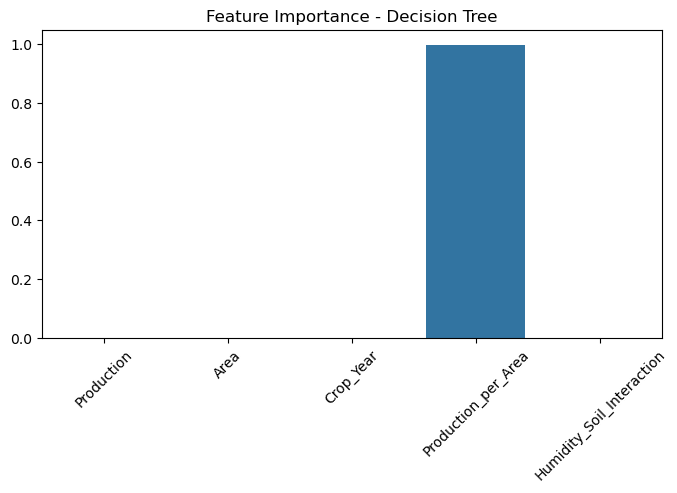

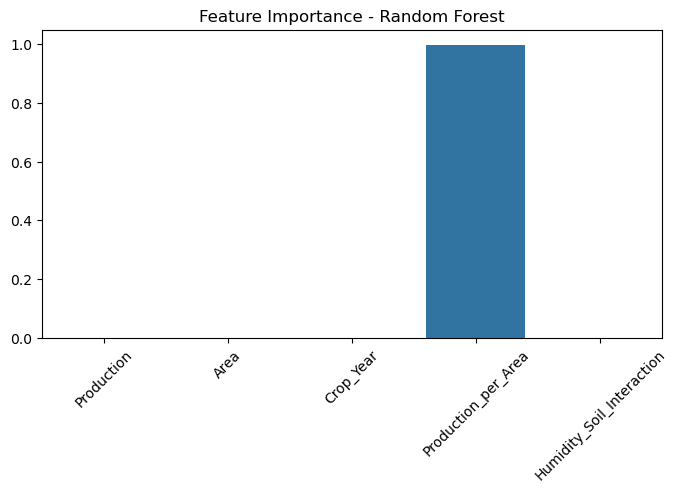

Decision Tree Cross-Validation R²: 0.9969
Random Forest Cross-Validation R²: 0.9970


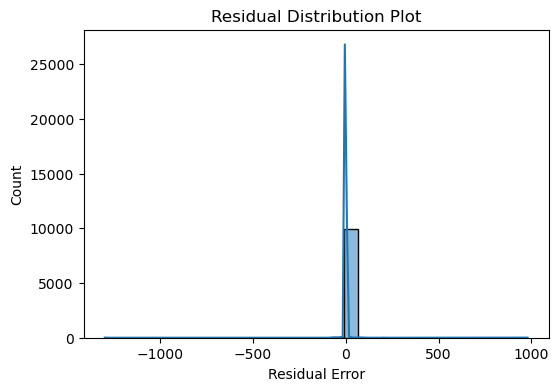

c:\Users\DELL\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


NotFittedError: This RandomForestRegressor instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

In [73]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import time
import psutil
import os
import platform
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# Load dataset
df_AAA = pd.read_csv("FinalDataset.csv")  # Uncomment if loading from CSV


# Feature Engineering: Creating new features
df_AAA["Yield"] = (df_AAA["Production"] / df_AAA["Area"])

df_AAA["Production_per_Area"] = df_AAA["Production"] / (df_AAA["Area"] + 1)  # Avoid division by zero

df_AAA["Humidity_Soil_Interaction"] = df_AAA["Humidity"] * df_AAA["Soil_Moisture"]


df_AAA
# Selecting important features
selected_features = ["Production", "Area", "Crop_Year", "Production_per_Area", "Humidity_Soil_Interaction"]
X_AAA = df_AAA[selected_features]
y_AAA = df_AAA["Yield"]

# Train-test split
X_train_AAA, X_test_AAA, y_train_AAA, y_test_AAA = train_test_split(X_AAA, y_AAA, test_size=0.2, random_state=42)

# Normalization and Standardization
scaler = StandardScaler()
X_train_AAA = scaler.fit_transform(X_train_AAA)
X_test_AAA = scaler.transform(X_test_AAA)

y_scaler = StandardScaler()
y_train_AAA = y_scaler.fit_transform(y_train_AAA.values.reshape(-1, 1)).ravel()

# Model Selection
models = {
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "Random Forest": RandomForestRegressor(random_state=42)
}

# Hyperparameter tuning parameters
param_grid = {
    "Decision Tree": {"max_depth": [3, 5, 10, None]},
    "Random Forest": {"n_estimators": [10, 50, 100], "max_depth": [3, 5, 10, None]}
}

results = {}
feature_importance = {}
for name, model in models.items():
    print(f"Training {name}...")
    start_time = time.time()
    
    random_search = RandomizedSearchCV(model, param_grid[name], cv=5, scoring='r2', n_iter=30, random_state=42)
    random_search.fit(X_train_AAA, y_train_AAA)
    best_model = random_search.best_estimator_
    
    best_model.fit(X_train_AAA, y_train_AAA)
    y_pred = best_model.predict(X_test_AAA)
    y_pred = y_scaler.inverse_transform(y_pred.reshape(-1, 1)).ravel()
    
    end_time = time.time()
    training_time = end_time - start_time
    
    r2 = r2_score(y_test_AAA, y_pred)
    mae = mean_absolute_error(y_test_AAA, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test_AAA, y_pred))
    results[name] = {"R²": r2, "MAE": mae, "RMSE": rmse, "Training Time (s)": training_time}
    
    # Feature Importance for Tree-based models
    if name in ["Random Forest", "Decision Tree"]:
        feature_importance[name] = best_model.feature_importances_

# Display results
for model, metrics in results.items():
    print(f"{model}: R²={metrics['R²']:.4f}, MAE={metrics['MAE']:.4f}, RMSE={metrics['RMSE']:.4f}, Training Time={metrics['Training Time (s)']:.2f} sec")

# Feature Importance Plot
for model, importance in feature_importance.items():
    plt.figure(figsize=(8, 4))
    sns.barplot(x=selected_features, y=importance)
    plt.title(f"Feature Importance - {model}")
    plt.xticks(rotation=45)
    plt.show()

# Cross-Validation for Stability
cv_results = {}
for name, model in models.items():
    scores = cross_val_score(model, X_train_AAA, y_train_AAA, cv=5, scoring='r2')
    cv_results[name] = np.mean(scores)
    print(f"{name} Cross-Validation R²: {cv_results[name]:.4f}")

# # Correlation Matrix after Feature Engineering
# plt.figure(figsize=(8, 6))
# sns.heatmap(df_AAA.corr(), annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
# plt.title("Correlation Matrix After Feature Engineering")
# plt.show()

# Residual Plot
plt.figure(figsize=(6, 4))
sns.histplot(y_test_AAA - y_pred, bins=30, kde=True)
plt.xlabel("Residual Error")
plt.title("Residual Distribution Plot")
plt.show()

# Predict on new data (example input)
new_data = np.array([[2000, 0.000198, 0.000217, 0.000198, 0.343897]])  # Example values
new_data_scaled = scaler.transform(new_data)  # Use already fitted scaler
predicted_yield_scaled = models["Random Forest"].predict(new_data_scaled)
predicted_yield = y_scaler.inverse_transform(predicted_yield_scaled.reshape(-1, 1)).ravel()[0]
print(f"Predicted Yield: {predicted_yield:.4f}")

# Resource Considerations
print("\nResource Considerations:")
print(f"- System: {platform.system()} {platform.release()}")
print(f"- CPU Cores: {psutil.cpu_count(logical=True)}")
print(f"- RAM Usage: {psutil.virtual_memory().used / (1024 ** 3):.2f} GB / {psutil.virtual_memory().total / (1024 ** 3):.2f} GB")
print("- Training Decision Trees and Random Forests is computationally efficient.")
print("- Using GPUs is beneficial for deep learning models but unnecessary for our tabular data.")
